<H1> Les jeux de données pour le projet </H1>

Dans ce notebook nous présentons les jeux de données utilisés pour le projet. Nous proposons également des fonctions pour permettre de pouvoir facilement les données.   

Il n'y a donc plus qu'à chercher les meilleurs modèles et à répondre aux questions de l'énoncé du projet.   

Bon courage !

ps : il y a trois jeux de données et ils sont très différents donc attention vous aurez peut être 3 modèles différents.

### Installation



Avant de commencer, il est nécessaire de déjà posséder dans son environnement toutes les librairies utiles. Dans la seconde cellule nous importons toutes les librairies qui seront utiles à ce notebook. Il se peut que, lorsque vous lanciez l'éxecution de cette cellule, une soit absente. Dans ce cas il est nécessaire de l'installer. Pour cela dans la cellule suivante utiliser la commande :  

*! pip install nom_librairie*  

**Attention :** il est fortement conseillé lorsque l'une des librairies doit être installer de relancer le kernel de votre notebook.

**Remarque :** même si toutes les librairies sont importées dès le début, les librairies utiles pour des fonctions présentées au cours de ce notebook sont ré-importées de manière à indiquer d'où elles viennent et ainsi faciliter la réutilisation de la fonction dans un autre projet.



In [ ]:
# utiliser cette cellule pour installer les librairies manquantes
# pour cela il suffit de taper dans cette cellule : !pip install nom_librairie_manquante
# d'exécuter la cellule et de relancer la cellule suivante pour voir si tout se passe bien
# recommencer tant que toutes les librairies ne sont pas installées ...

# sous Colab il faut déjà intégrer ces deux librairies

!pip install umap-learn[plot]
!pip install holoviews
!pip install -U ipykernel

# eventuellement ne pas oublier de relancer le kernel du notebook

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 38.5 MB/s eta 0:00:00
  Created wheel for umap-learn: filename=umap_learn-0.5.5-py3-none-any.whl size=86832 sha256=817bc00acec964ebc6163d0cf7f2c15ac0b625022122512c13dc4d68db871b82
  Stored in directory: /root/.cache/pip/wheels/3a/70/07/428d2b58660a1a3b431db59b806a10da736612ebbc66c1bcc5
Successfully built umap-learn
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.6/114.6 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 10.3 MB/s eta 0:00:00
  Attempting uninstall: ipykernel
    Found existing installation: ipykernel 5.5.6
    Uninstalling ipykernel-5.5.6:
      Successfully uninstalled ipykernel-5.5.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are in

#Libraire et fonction de base

In [5]:
# Importation des différentes librairies utiles pour le notebook

#Sickit learn met régulièrement à jour des versions et
#indique des futurs warnings.
#ces deux lignes permettent de ne pas les afficher.
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# librairies générales
import pickle
import pandas as pd
from scipy.stats import randint
import numpy as np
import string
import time
import base64
import re
import sys
import copy
import random
import math

from numpy import mean
from numpy import std


# librairie affichage
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import plotly.graph_objs as go
import plotly.offline as py

from sklearn.metrics import confusion_matrix
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score

# TensorFlow et keras
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
from keras import layers
from keras import models
from keras import optimizers
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.image import img_to_array, load_img
from keras.callbacks import ModelCheckpoint, EarlyStopping
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten,BatchNormalization
from keras.layers import Conv2D, MaxPooling2D, LeakyReLU, ReLU
from keras.preprocessing import image
from tqdm import tqdm
from keras.models import load_model
from sklearn.model_selection import KFold
from keras.datasets import fashion_mnist
from tensorflow.keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Dense
from keras.layers import Flatten
from tensorflow.keras.optimizers import SGD, RMSprop , Adamax, Adam
import os
from os import listdir
from os.path import isfile, join
import cv2
import glob

In [6]:
def plot_curves_confusion (history,confusion_matrix,class_names):
  plt.figure(1,figsize=(16,6))
  plt.gcf().subplots_adjust(left = 0.125, bottom = 0.2, right = 1,
                          top = 0.9, wspace = 0.25, hspace = 0)

  # division de la fenêtre graphique en 1 ligne, 3 colonnes,
  # graphique en position 1 - loss fonction

  plt.subplot(1,3,1)
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['Training loss', 'Validation loss'], loc='upper left')
  # graphique en position 2 - accuracy
  plt.subplot(1,3,2)
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['Training accuracy', 'Validation accuracy'], loc='upper left')

  # matrice de correlation
  plt.subplot(1,3,3)
  sns.heatmap(conf,annot=True,fmt="d",cmap='Blues',xticklabels=class_names, yticklabels=class_names)# label=class_names)
  # labels, title and ticks
  plt.xlabel('Predicted', fontsize=12)
  #plt.set_label_position('top')
  #plt.set_ticklabels(class_names, fontsize = 8)
  #plt.tick_top()
  plt.title("Correlation matrix")
  plt.ylabel('True', fontsize=12)
  #plt.set_ticklabels(class_names, fontsize = 8)
  plt.show()


def plot_curves(histories):
    plt.figure(1,figsize=(16,6))
    plt.gcf().subplots_adjust(left = 0.125, bottom = 0.2, right = 1,
                          top = 0.9, wspace = 0.25, hspace = 0)
    for i in range(len(histories)):
    	# plot loss
    	plt.subplot(121)
    	plt.title('Cross Entropy Loss')
    	plt.plot(histories[i].history['loss'], color='blue', label='train')
    	plt.plot(histories[i].history['val_loss'], color='red', label='test')
    	plt.ylabel('loss')
    	plt.xlabel('epoch')
    	plt.legend(['Training loss', 'Validation loss'], loc='upper left')
    	# plot accuracy
    	plt.subplot(122)
    	plt.title('Classification Accuracy')
    	plt.ylabel('accuracy')
    	plt.xlabel('epoch')
    	plt.plot(histories[i].history['accuracy'], color='blue', label='train')
    	plt.plot(histories[i].history['val_accuracy'], color='red',
                 label='test')
    	plt.legend(['Training accuracy', 'Validation accuracy'], loc='upper left')
    plt.show()

Pour pouvoir sauvegarder sur votre répertoire Google Drive, il est nécessaire de fournir une autorisation. Pour cela il suffit d'éxecuter la ligne suivante et de saisir le code donné par Google.

In [ ]:
# pour monter son drive Google Drive local
#from google.colab import drive
#drive.mount('/content/gdrive')

Corriger éventuellement la ligne ci-dessous pour mettre le chemin vers un répertoire spécifique dans votre répertoire Google Drive :

In [ ]:
#import sys
#my_local_drive='/content/gdrive/My Drive/Colab Notebooks/ML_FDS'
# Ajout du path pour les librairies, fonctions et données
#sys.path.append(my_local_drive)
# Se positionner sur le répertoire associé
#%cd $my_local_drive

#%pwd

# Jeux de données


Récupération des jeux de données :      

In [ ]:
!wget https://www.lirmm.fr/~poncelet/Ressources/Tiger-Fox-Elephant.zip


--2023-12-14 05:30:35--  https://www.lirmm.fr/~poncelet/Ressources/Tiger-Fox-Elephant.zip
Resolving www.lirmm.fr (www.lirmm.fr)... 193.49.104.251
Connecting to www.lirmm.fr (www.lirmm.fr)|193.49.104.251|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7605545 (7.3M) [application/zip]
Saving to: ‘Tiger-Fox-Elephant.zip’

Tiger-Fox-Elephant. 100%[===================>]   7.25M  4.61MB/s    in 1.6s    

2023-12-14 05:30:38 (4.61 MB/s) - ‘Tiger-Fox-Elephant.zip’ saved [7605545/7605545]



In [ ]:
import zipfile
with zipfile.ZipFile("Tiger-Fox-Elephant.zip","r") as zip_ref:
    zip_ref.extractall("Data_Project")

##Affichage et opération sur  les image renard


Il y a trois jeux de données différents : des tigres, des éléphants et des renards. Pour chacun d'entre eux il y a un ensemble d'images positive et un ensemble d'images négatives. Par exemple dans le répertoire *tiger* il n'y a que des images de tigre et dans le répertoire *Tiger_negative_class* il n'y a que des images d'animaux qui ne correspondent pas à des tigres.   

Le code ci-dessous permet de visualiser quelques images contenues dans le répertoire *tiger*.

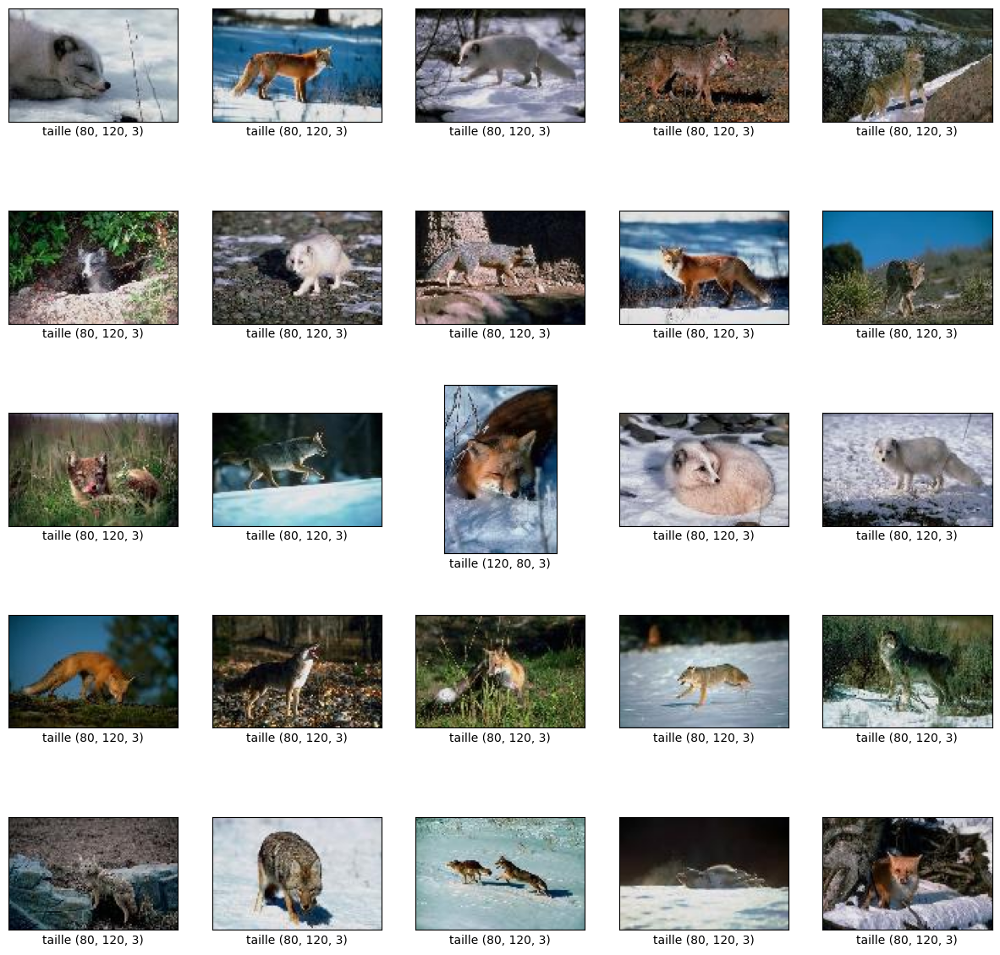

In [ ]:
mypath='Data_Project/Tiger-Fox-Elephant/fox'
onlyfiles = [ f for f in listdir(mypath) if isfile(join(mypath,f)) ]
images = np.empty(len(onlyfiles), dtype=object)
for n in range(0, len(onlyfiles)):
  images[n] = cv2.imread( join(mypath,onlyfiles[n]) )


COLUMNS = 25 # Nombre d'images à afficher

plt.figure(figsize=(15,15))
for i in range(COLUMNS):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    # cv2 lit met les images en BGR et matplotlib lit du RGB
    # il faut donc convertir pour afficher les bonnes couleurs
    images[i] = cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB)
    plt.imshow(images[i],cmap=plt.cm.binary)
    plt.xlabel('taille ' + str(images[i].shape))

Nous pouvons constater que les images ne sont pas de la même taille. Il faut donc les convertir. Une manière simple de faire et de faire la conversion lors de la lecture des images : ici nous convertissons toutes les images en 124x124.

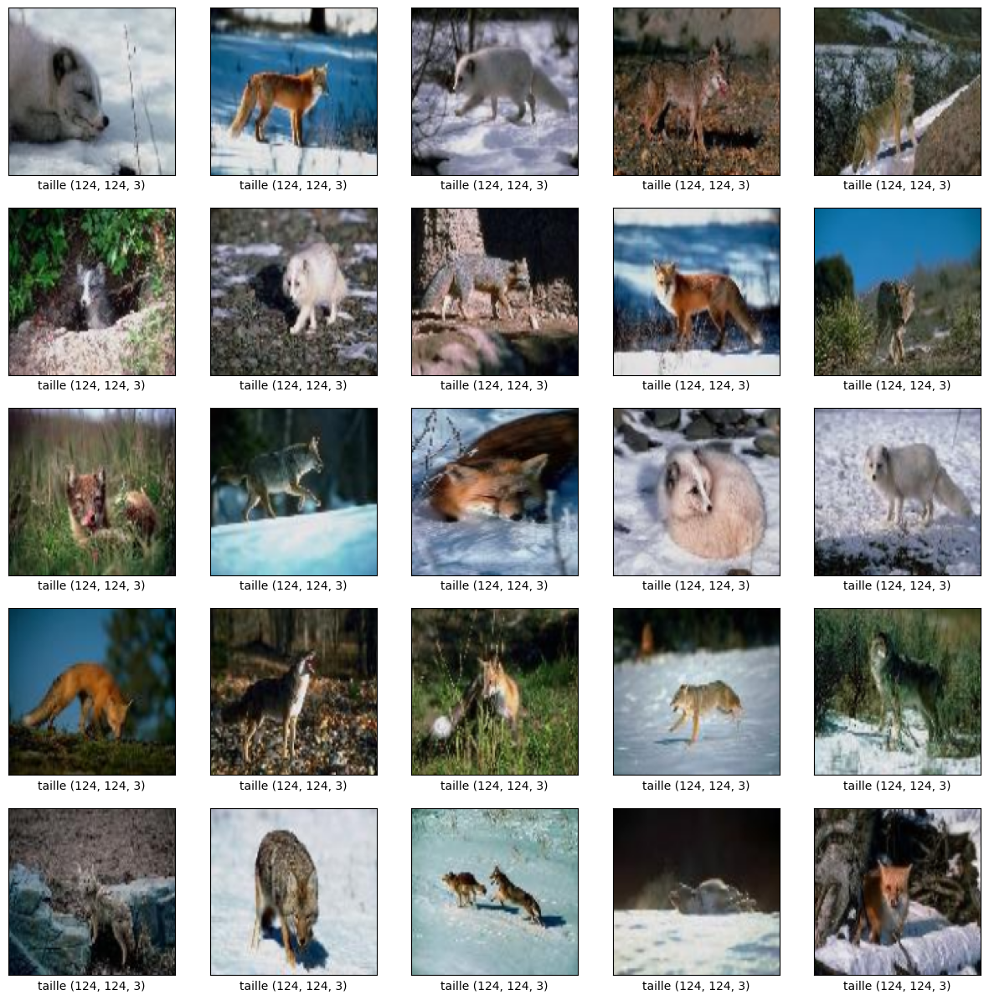

In [ ]:
IMG_SIZE=124
mypath='Data_Project/Tiger-Fox-Elephant/fox'
onlyfiles = [ f for f in listdir(mypath) if isfile(join(mypath,f)) ]
images = np.empty(len(onlyfiles), dtype=object)
for n in range(0, len(onlyfiles)):
  images[n] = cv2.imread( join(mypath,onlyfiles[n]) )
  images[n]  = cv2.resize(images[n], (IMG_SIZE, IMG_SIZE))

plt.figure(figsize=(15,15))
for i in range(COLUMNS):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    # cv2 lit met les images en BGR et matplotlib lit du RGB
    # il faut donc convertir pour afficher les bonnes couleurs
    images[i] = cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB)
    plt.imshow(images[i],cmap=plt.cm.binary)
    plt.xlabel('taille ' + str(images[i].shape))

# Création du  jeu de données

Actuellement pour chaque animal nous avons un répertoire qui contient des images positives et un répertoire qui contient des images négatives. Pour pouvoir créer un jeu de données nous devons obtenir X et y. Les fonctions ci-dessous permettent de générer, à partir des répertoires, un jeu de données aléatoire pour X et y.

In [7]:
def create_training_data(path_data, list_classes):
  training_data=[]
  for classes in list_classes:
      path=os.path.join(path_data, classes)
      class_num=list_classes.index(classes)
      for img in os.listdir(path):
        try:
          img_array = cv2.imread(os.path.join(path,img), cv2.IMREAD_UNCHANGED)
          new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
          training_data.append([new_array, class_num])
        except Exception as e:
          pass
  return training_data

def create_X_y (path_data, list_classes):
      # récupération des données
      training_data=create_training_data(path_data, list_classes)
      # tri des données
      random.shuffle(training_data)
      # création de X et y
      X=[]
      y=[]
      for features, label in training_data:
        X.append(features)
        y.append(label)
      X=np.array(X).reshape(-1,IMG_SIZE, IMG_SIZE, 3)
      y=np.array(y)
      return X,y

def plot_examples(X,y):
  plt.figure(figsize=(15,15))
  for i in range(COLUMNS):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    # cv2 lit met les images en BGR et matplotlib lit du RGB
    X[i] = cv2.cvtColor(X[i], cv2.COLOR_BGR2RGB)
    plt.imshow(X[i]/255.,cmap=plt.cm.binary)
    plt.xlabel('classe ' + str(y[i]))

Définition de constante globale      


In [ ]:
# constantes globales

IMG_SIZE=124  #Taille de l'image
COLUMNS = 25 # Nombre d'images à afficher

# Modèle Baseline


Tout d'abord nous avons créé un modèle de classifier de base (baseline) (1 seule couche de CNN) et évalué sur les différents jeux de données.

Première fonction permet de charger le jeu de données.

La fonction train_test_split est couramment utilisée en apprentissage automatique (machine learning) pour diviser un ensemble de données en deux sous-ensembles distincts : un ensemble d'entraînement (training set) et un ensemble de test (test set). Cette division est cruciale pour évaluer les performances d'un modèle sur des données qu'il n'a pas vues pendant l'entraînement.

##Fonction associé

In [8]:
from sklearn.model_selection import train_test_split

In [9]:
#en entrée (my_classes) : une liste de deux str
#exemple my_classes = ["elephant", "Elephant_negative_class"]
def load_dataset(my_classes):
  #chargement des données
  my_path="Data_Project/Tiger-Fox-Elephant/"
  X,y = create_X_y(my_path,my_classes)
  X_train,X_test , y_train, y_test  = train_test_split(X,y)

  return X_train, y_train, X_test, y_test

Seconde fonction nettoie les données : conversion en float et normalisation pour éviter les trop grandes valeurs

In [10]:
def clean_data(train, test):
    # convertion d'entier en float
    train_norm = train.astype('float32')
    test_norm = test.astype('float32')
    # normalisation entre 0 et 1
    train_norm = train_norm / 255.0
    test_norm = test_norm / 255.0
    return train_norm, test_norm

Pour évaluer le modèle nous utilisons un K-fold. Pour que les expérimentations ne durent pas trop longtemps le nombre de folds par défaut est fixé 5 et le nombre de d'épochs à 30.

In [11]:
 #Evaluation avec un k-fold
def evaluate_model(model, dataX, dataY, n_folds=5, epochs=30):
    scores, histories = list(), list()
    kfold = KFold(n_folds, shuffle=True, random_state=1)
    # parcourir les splits du k-fold
    for train_ix, test_ix in kfold.split(dataX):
        #clone model
        model_kfold = tf.keras.models.clone_model(model)

        #compile model
        model_kfold.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss='binary_crossentropy',metrics=['accuracy'])
        print(model_kfold.summary())

        # selection des données
        X_train, y_train, X_test, y_test = dataX[train_ix], dataY[train_ix], dataX[test_ix], dataY[test_ix]

        #EarlyStopping pour éviter l'augmentation de la courbe validation loss
        #earlyStop = EarlyStopping(monitor='val_loss',mode='min',verbose=1, patience=10)

        # fit du modele
        history = model_kfold.fit(X_train, y_train, epochs=epochs, batch_size=32,validation_data=(X_test, y_test), verbose=1)
        # evaluate du modele
        loss, acc = model_kfold.evaluate(X_test, y_test, verbose=0)
        print('accuracy %.3f' % (acc * 100.0))
        scores.append(acc)
        histories.append(history)
    return scores, histories


A présent, nous considérons le modèle.  Pour le modèle baseline nous allons faire un modèle assez simple : une couche conv2D et un pooling
suivi bien entendu par un flatten et une couche dense avant d'avoir une couche finale avec un sigmoid. La taille du filtre est de 3x3 et il y a 32
filtres :

In [12]:
 #definition du premier modèle baseline
def define_model():
    model = Sequential()
    # Convolution and pooling
    model.add(Conv2D(filters=32, kernel_size=(3,3),
                     activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3),
                     name="Conv2D_1"))

    model.add(MaxPooling2D(pool_size=(2, 2),
                           name="Maxpooling2D_1"))
    # flatten
    model.add(Flatten(name="flatten") )

    # Partie classification
    model.add(Dense(100, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))



    return model

La fonction suivante permet de lancer l'ensemble des fonctions précédentes.


In [13]:
def run_evaluation(n_folds,epochs, my_classes):
    # load dataset
    X_train, y_train, X_test, y_test = load_dataset(my_classes)
    # Nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)
    # define model
    model = define_model()
    print(model.summary())

    scores, histories = evaluate_model(model, X_train, y_train, n_folds,epochs)
    plot_curves_subplot(histories)
    plot_curves(histories)
    print('Accuracy: mean=%.3f std=%.3f, n=%d' % (mean(scores)*100, std(scores)*100, len(scores)))


def plot_curves_subplot(histories):
    #on arrondi au sup pour qu'il y ait assez de subplot pour chaque history
    nb_subplot = len(histories)
    fig = plt.figure(figsize=(16,32))
    fig.subplots_adjust(hspace=0.2, wspace=0.2)

    iterator = 1
    for i in range(len(histories)):

      ax = fig.add_subplot(nb_subplot, 2, iterator)
      ax.plot(histories[i].history['val_loss'], color='red', label='test')
      ax.plot(histories[i].history['loss'], color='blue', label='train')
      ax.set_ylabel('loss')
      ax.set_xlabel('epoch')
      ax.legend(['Validation loss', 'Training loss'], loc='upper left')

      iterator+=1

      ax = fig.add_subplot(nb_subplot, 2, iterator)
      ax.plot(histories[i].history['val_accuracy'], color='red', label='test')
      ax.plot(histories[i].history['accuracy'], color='blue', label='train')
      ax.set_ylabel('accuracy')
      ax.set_xlabel('epoch')
      ax.legend(['Validation accuracy', 'Training accuracy'], loc='upper left')

      iterator+=1

    plt.show()



## RUN

Evaluation du modèle et affichage des différentes courbes pour les k folds.

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 122, 122, 32)      896       
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 61, 61, 32)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 119072)            0         
                                                                 
 dense_11 (Dense)            (None, 100)               11907300  
                                                                 
 dense_12 (Dense)            (None, 1)                 101       
                                                                 
Total params: 11908297 (45.43 MB)
Trainable params: 11908297 (45.43 MB)
Non-trainable params: 0 (0.00 Byte)
____________

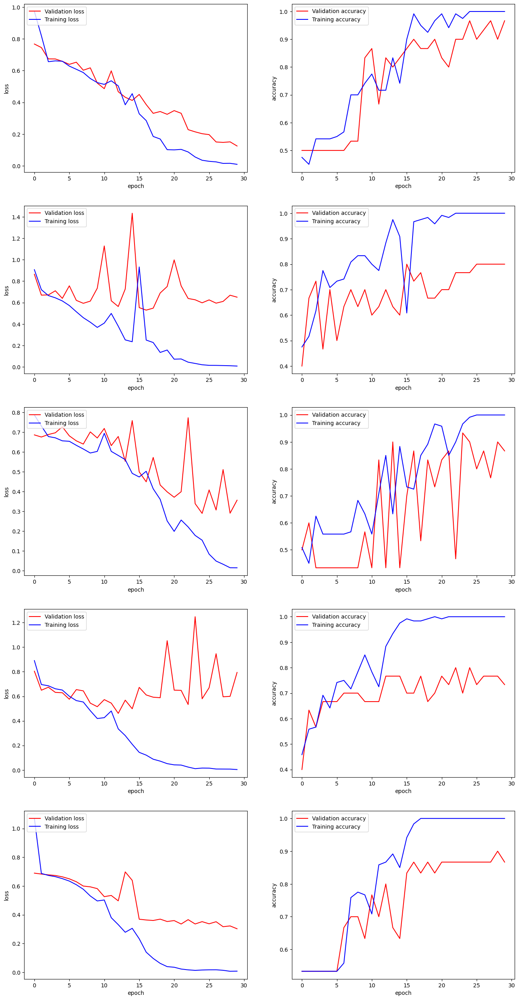

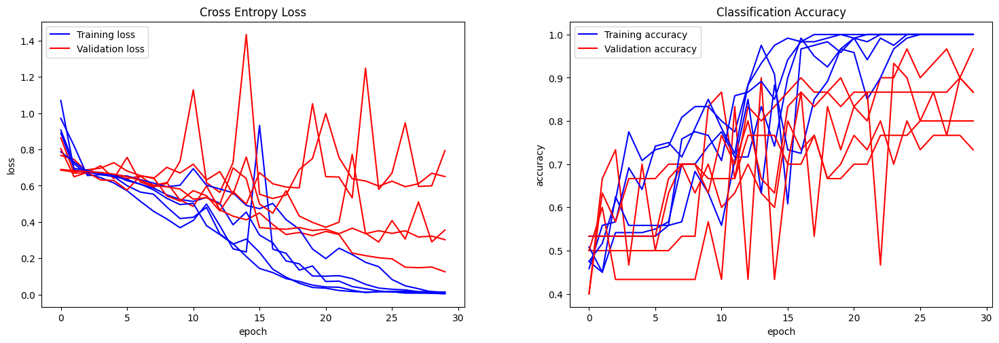

Accuracy: mean=84.667 std=7.775, n=5


In [ ]:
my_classes = ['fox','Fox_negative_class']
run_evaluation(5, 30, my_classes)

# Modèle Baseline Amélioré
On va faire une recherche des meilleures hyperparametres en utilisant le RandomSearch et GridSearch

##Fonctions et libairies

In [14]:
!pip install keras-tuner -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 1.6 MB/s eta 0:00:00


In [15]:
import numpy as np
import os
import seaborn as sns
import random
import shutil
import keras
import pandas as pd
import cv2
import matplotlib.cm as cm
import tensorflow as tf
from keras import metrics
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.saving import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import KFold
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam, Adamax, Adadelta, Adagrad, SGD
from keras.callbacks import Callback, ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from keras.layers import Dropout, Dense, GlobalAveragePooling2D, Flatten, Rescaling, Conv2D, BatchNormalization, MaxPooling2D
import matplotlib.pyplot as plt
import pathlib
import sys
import keras_tuner

In [ ]:
 #definition du premier modèle baseline
def build_model_fox(hp):
    model = Sequential()
    # Convolution and pooling
    #filters = hp.Choice('filters_units_1',values=[64,128])
    #de base c'est 32
    model.add(Conv2D(64, kernel_size=(3,3),
                     activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3),
                     name="Conv2D_1"))

    model.add(MaxPooling2D(pool_size=(2, 2),
                           name="Maxpooling2D_1"))

        # flatten
    model.add(Flatten(name="flatten") )

    acti = hp.Choice('activation', values=["relu","elu","tanh"])
    # Partie classification
    model.add(Dense(100, activation=acti))#name="dense"
    model.add(Dropout(hp.Choice('dropout_rate',values=[0.1,0.2,0.3,0.4,0.5])))
    model.add(Dense(1, activation='sigmoid'))

    dic = {
       #Définit le nombre d'échantillons qui seront utilisés pour mettre à jour les poids du réseau neuronal
       "batch_size": hp.Choice('batch_size',values=([8,16,32,64])),
       #Dropout_rate est un paramètre qui consiste à abandonner aléatoirement un certain pourcentage de neurones lors de l'entrainement
       #"dropout_rate": hp.Choice('dropout_rate',values=[0.1,0.2,0.3,0.4,0.5]),
    }


  # compilation du model de classification
    lr = hp.Choice("learning_rate", values=[1e-2, 1e-3, 1e-4])
    # Selectionne l'optimizer
    opt=hp.Choice('optimizer', values=['adam','adamax','adagrad','adadelta','SGD'])
    # condition pour chaque optimizer
    if opt == 'adam':
      opt=Adam(learning_rate=lr)
    elif opt == 'adamax':
      opt=Adamax(learning_rate=lr)
    elif opt == 'adagrad':
      opt=Adagrad(learning_rate=lr)
    elif opt == 'adadelta':
      opt=SGD(learning_rate=lr)
    elif opt == 'SGD':
      opt=SGD(learning_rate=lr)
    else :
      raise

    model.compile(optimizer=opt, loss='binary_crossentropy', metrics='accuracy')


    return model

On applique le random search

In [ ]:
tuner = keras_tuner.RandomSearch(
    build_model_fox,
    max_trials=10,
    overwrite=True,
    objective="val_accuracy",
    directory="/tmp/tb",
)

In [ ]:
my_classes = ['fox','Fox_negative_class']

X_train, y_train, X_test, y_test = load_dataset(my_classes)
# Nettoyage et normalisation
X_train, X_test = clean_data(X_train, X_test)

tuner.search(
    X_train,
    y_train,
    validation_data=(X_test, y_test),
    epochs=30,
    callbacks=[keras.callbacks.TensorBoard("/tmp/tb_logs"),  EarlyStopping(monitor='val_loss',mode='min',verbose=1, patience=10)],
)

Trial 10 Complete [00h 00m 08s]
val_accuracy: 0.5199999809265137

Best val_accuracy So Far: 1.0
Total elapsed time: 00h 03m 05s


Meilleur parametre trouvé par le RandomSearch

In [ ]:
best_hps = tuner.get_best_hyperparameters(num_trials = 1)[0]
print(best_hps.values)

{'activation': 'elu', 'dropout_rate': 0.4, 'batch_size': 64, 'learning_rate': 0.01, 'optimizer': 'adamax'}


On applique le random search, avec pour base les résultats du RandomSearch

In [ ]:
grid_tuner = keras_tuner.GridSearch(
    build_model_fox,
    max_trials=10,
    hyperparameters=best_hps,
    overwrite=True,
    objective="val_accuracy",
    directory="/tmp/tb",
)
grid_tuner.search(
    X_train,
    y_train,
    validation_data=(X_test, y_test),
    epochs=30,
    callbacks=[keras.callbacks.TensorBoard("/tmp/tb_logs"),  EarlyStopping(monitor='val_loss',mode='min',verbose=1, patience=10)],
)

Trial 10 Complete [00h 00m 22s]
val_accuracy: 0.7599999904632568

Best val_accuracy So Far: 1.0
Total elapsed time: 00h 03m 27s


Meilleur parametre apres un GridSearch

In [ ]:
best_hps2 = grid_tuner.get_best_hyperparameters(num_trials = 1)[0]
print(best_hps2.values)

{'activation': 'relu', 'dropout_rate': 0.1, 'batch_size': 8, 'learning_rate': 0.001, 'optimizer': 'adamax'}


Modification du modéle initial

In [ ]:
from keras.regularizers import l2

def define_model_fox_upgrade():
    model = Sequential()
    # Convolution and pooling
    model.add(Conv2D(filters=128, kernel_size=(3,3),
                     activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3),
                     name="Conv2D_1"))

    model.add(MaxPooling2D(pool_size=(2, 2),
                           name="Maxpooling2D_1"))
    # flatten
    model.add(Flatten(name="flatten") )

    # Partie classification
    model.add(Dense(100, activation='relu'))
   # model.add(Dense(100, activation='relu',kernel_regularizer=l2(0.1)))
    model.add(Dropout(0.1))
    #model.add(layers.BatchNormalization())
    #keras.regularizers.L1(l1=0.1)

    model.add(Dense(1, activation='sigmoid'))


    return model

 #Evaluation avec un k-fold
def evaluate_model_fox_upgrade(model, dataX, dataY, n_folds=5, epochs=30):
    scores, histories = list(), list()
    kfold = KFold(n_folds, shuffle=True, random_state=1)
    # parcourir les splits du k-fold
    for train_ix, test_ix in kfold.split(dataX):
        #clone model
        model_kfold = tf.keras.models.clone_model(model)

        #compile model
        #adamax, 0,001
        model_kfold.compile(optimizer=Adamax(learning_rate=0.001), loss='binary_crossentropy',metrics=['accuracy'])
        print(model_kfold.summary())

        # selection des données
        X_train, y_train, X_test, y_test = dataX[train_ix], dataY[train_ix], dataX[test_ix], dataY[test_ix]

        #EarlyStopping pour éviter l'augmentation de la courbe validation loss
        earlyStop = EarlyStopping(monitor='val_loss',mode='min',verbose=1, patience=10)

        # fit du modele
        history = model_kfold.fit(X_train, y_train, epochs=epochs, batch_size=8,validation_data=(X_test, y_test), verbose=1, callbacks=[earlyStop])
        # evaluate du modele
        loss, acc = model_kfold.evaluate(X_test, y_test, verbose=0)
        print('accuracy %.3f' % (acc * 100.0))
        scores.append(acc)
        histories.append(history)
    return scores, histories

def run_evaluation_upgrade(n_folds,epochs, my_classes):
    # load dataset
    X_train, y_train, X_test, y_test = load_dataset(my_classes)
    # Nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)
    # define model
    model = define_model_fox_upgrade()
    print(model.summary())

    scores, histories = evaluate_model_fox_upgrade(model, X_train, y_train, n_folds,epochs)
    plot_curves_subplot(histories)
    print('Accuracy: mean=%.3f std=%.3f, n=%d' % (mean(scores)*100, std(scores)*100, len(scores)))



Resultat de la baseline avec un filtre 64

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 122, 122, 64)      1792      
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 61, 61, 64)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 238144)            0         
                                                                 
 dense_4 (Dense)             (None, 100)               23814500  
                                                                 
 dense_5 (Dense)             (None, 1)                 101       
                                                                 
Total params: 23816393 (90.85 MB)
Trainable params: 23816393 (90.85 MB)
Non-trainable params: 0 (0.00 Byte)
____________

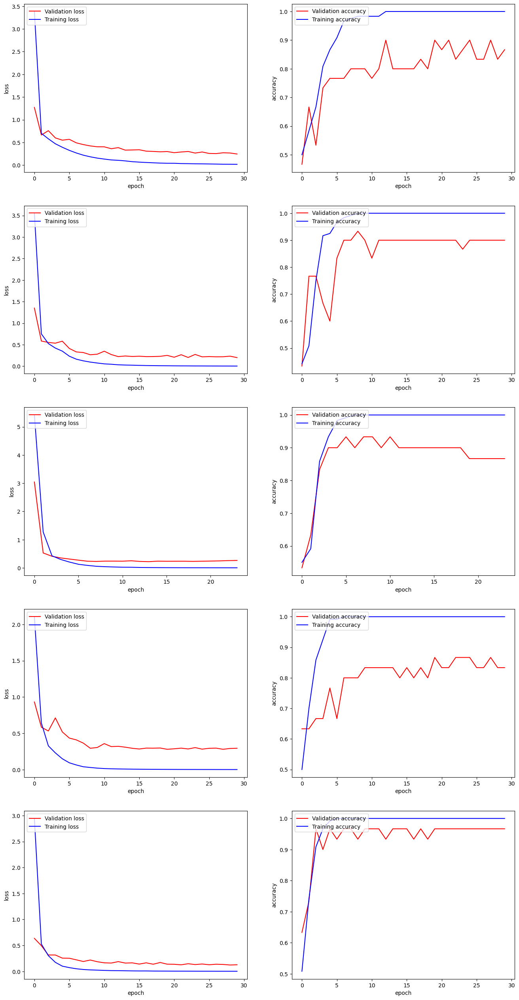

Accuracy: mean=88.667 std=4.522, n=5
bonjourcoucou


In [ ]:
my_classes = ['fox','Fox_negative_class']
run_evaluation_upgrade(5, 30, my_classes)

##Resultat avec drop out et variation de taille de filtre
 drop avec un filtre de 32

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 122, 122, 32)      896       
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 61, 61, 32)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 119072)            0         
                                                                 
 dense_10 (Dense)            (None, 100)               11907300  
                                                                 
 dropout_4 (Dropout)         (None, 100)               0         
                                                                 
 dense_11 (Dense)            (None, 1)                 101       
                                                      

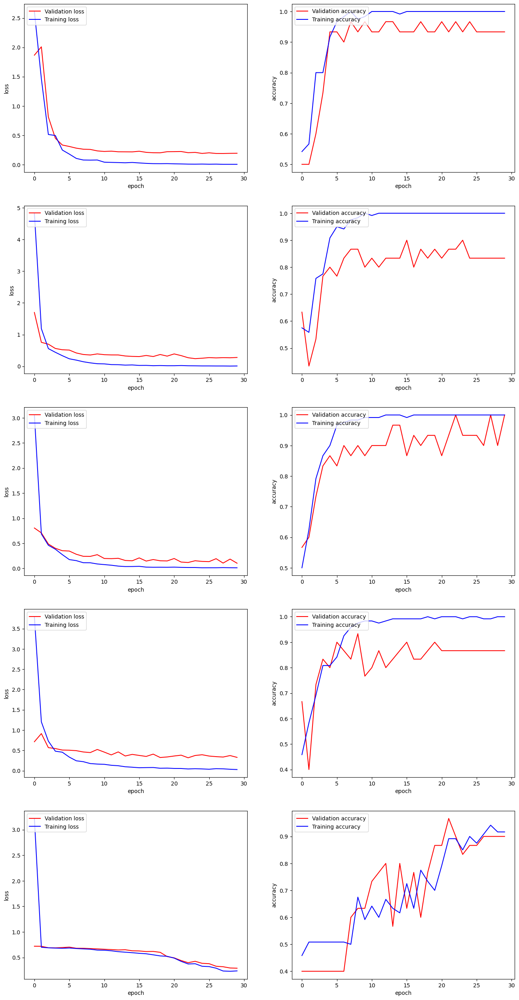

Accuracy: mean=90.667 std=5.735, n=5
bonjourcoucou


In [ ]:
my_classes = ['fox','Fox_negative_class']
run_evaluation_upgrade(5, 30, my_classes)

drop avec un filtre de 128

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 122, 122, 128)     3584      
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 61, 61, 128)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 476288)            0         
                                                                 
 dense_12 (Dense)            (None, 100)               47628900  
                                                                 
 dropout_5 (Dropout)         (None, 100)               0         
                                                                 
 dense_13 (Dense)            (None, 1)                 101       
                                                      

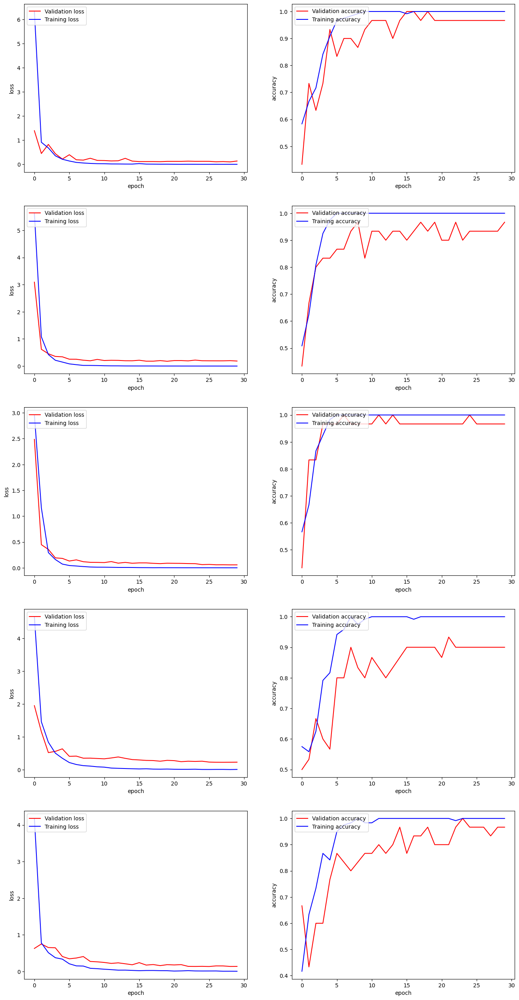

Accuracy: mean=95.333 std=2.667, n=5
bonjourcoucou


In [ ]:
my_classes = ['fox','Fox_negative_class']
run_evaluation_upgrade(5, 30, my_classes)

#Regularisation avec filtre = 64

## Drop out

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 122, 122, 64)      1792      
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 61, 61, 64)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 238144)            0         
                                                                 
 dense_2 (Dense)             (None, 100)               23814500  
                                                                 
 dropout_1 (Dropout)         (None, 100)               0         
                                                                 
 dense_3 (Dense)             (None, 1)                 101       
                                                      

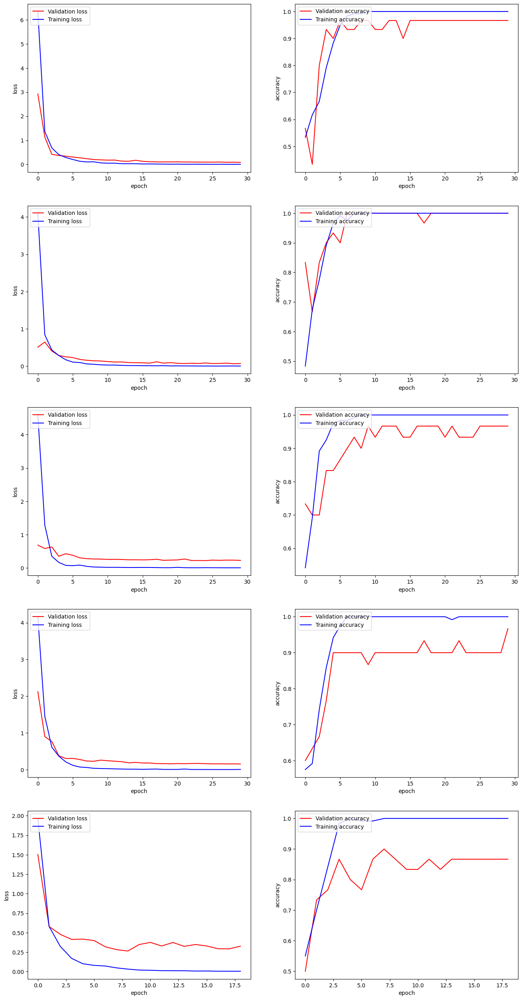

Accuracy: mean=95.333 std=4.522, n=5
bonjourcoucou


In [ ]:
my_classes = ['fox','Fox_negative_class']
run_evaluation_upgrade(5, 30, my_classes)

## Batchnormalisation

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 122, 122, 64)      1792      
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 61, 61, 64)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 238144)            0         
                                                                 
 dense_4 (Dense)             (None, 100)               23814500  
                                                                 
 dropout_2 (Dropout)         (None, 100)               0         
                                                                 
 dense_5 (Dense)             (None, 1)                 101       
                                                      

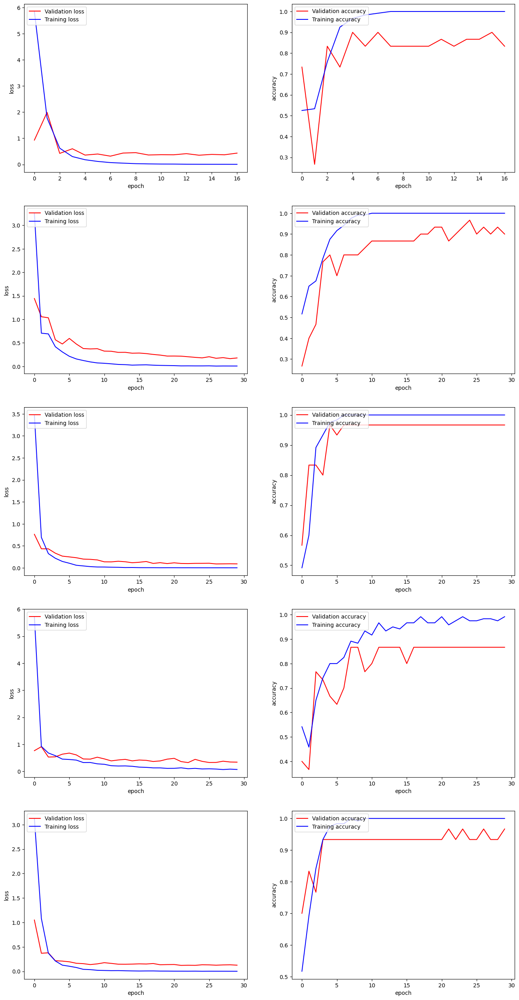

Accuracy: mean=90.667 std=5.333, n=5
bonjourcoucou


In [ ]:
my_classes = ['fox','Fox_negative_class']
run_evaluation_upgrade(5, 30, my_classes)

## Drop out + batch

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 122, 122, 128)     3584      
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 61, 61, 128)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 476288)            0         
                                                                 
 dense_6 (Dense)             (None, 100)               47628900  
                                                                 
 dropout_2 (Dropout)         (None, 100)               0         
                                                                 
 batch_normalization_1 (Bat  (None, 100)               400       
 chNormalization)                                     

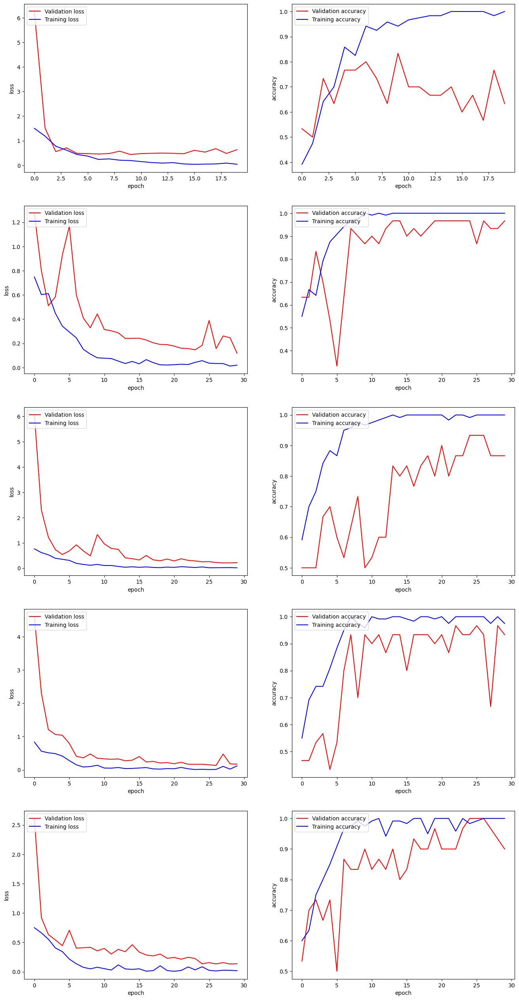

Accuracy: mean=86.000 std=11.813, n=5
bonjourcoucou


In [ ]:
my_classes = ['fox','Fox_negative_class']
run_evaluation_upgrade(5, 30, my_classes)

## Regularisateur L1

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 122, 122, 64)      1792      
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 61, 61, 64)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 238144)            0         
                                                                 
 dense_8 (Dense)             (None, 100)               23814500  
                                                                 
 dense_9 (Dense)             (None, 1)                 101       
                                                                 
Total params: 23816393 (90.85 MB)
Trainable params: 23816393 (90.85 MB)
Non-trainable params: 0 (0.00 Byte)
____________

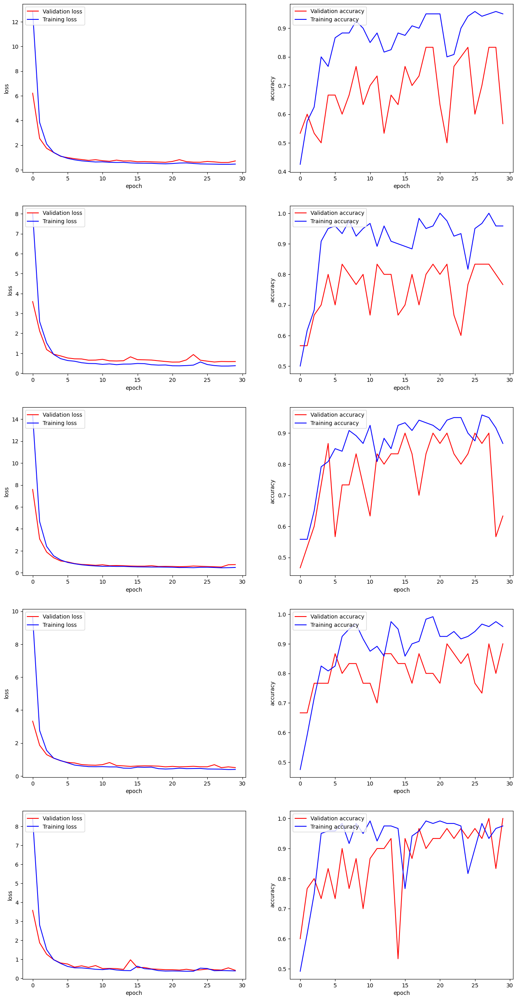

Accuracy: mean=77.333 std=16.111, n=5
bonjourcoucou


In [ ]:
my_classes = ['fox','Fox_negative_class']
run_evaluation_upgrade(5, 30, my_classes)

## Drop out + Regularisateur L1

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 122, 122, 64)      1792      
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 61, 61, 64)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 238144)            0         
                                                                 
 dense_10 (Dense)            (None, 100)               23814500  
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 dense_11 (Dense)            (None, 1)                 101       
                                                      

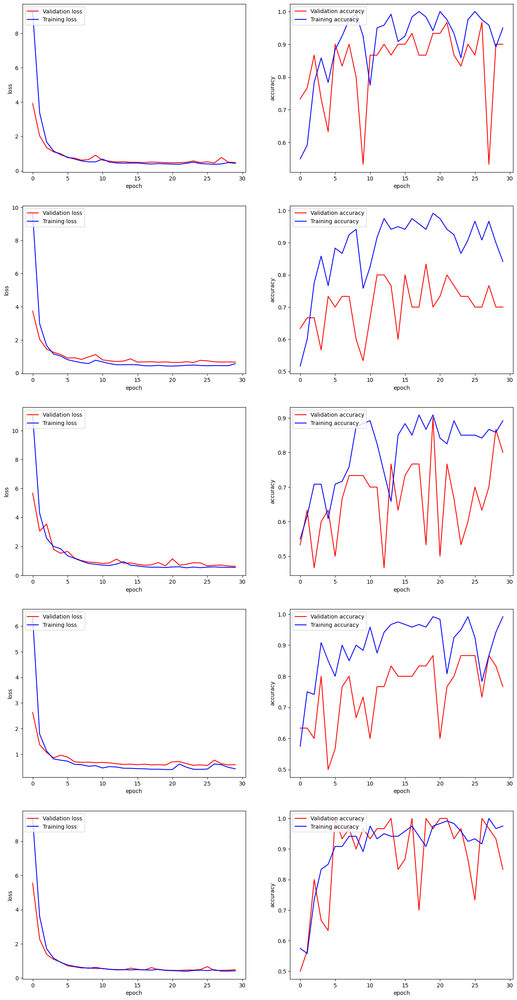

Accuracy: mean=80.000 std=6.667, n=5
bonjourcoucou


In [ ]:
my_classes = ['fox','Fox_negative_class']
run_evaluation_upgrade(5, 30, my_classes)

## Batchnormalisation + Regularisateur L1

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 122, 122, 64)      1792      
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 61, 61, 64)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 238144)            0         
                                                                 
 dense_12 (Dense)            (None, 100)               23814500  
                                                                 
 batch_normalization (Batch  (None, 100)               400       
 Normalization)                                                  
                                                                 
 dense_13 (Dense)            (None, 1)                

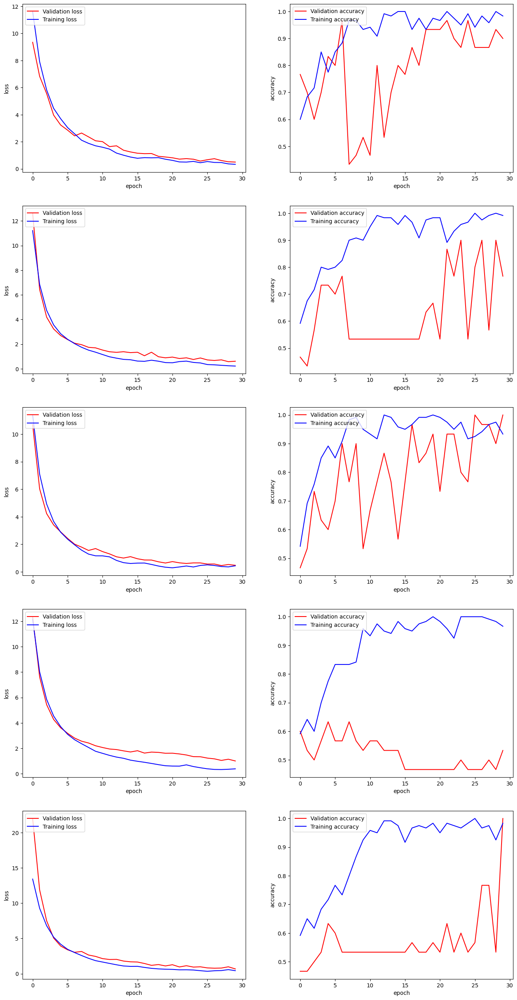

Accuracy: mean=84.000 std=17.563, n=5
bonjourcoucou


In [ ]:
my_classes = ['fox','Fox_negative_class']
run_evaluation_upgrade(5, 30, my_classes)

## Combinaison des trois

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 122, 122, 64)      1792      
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 61, 61, 64)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 238144)            0         
                                                                 
 dense (Dense)               (None, 100)               23814500  
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 batch_normalization (Batch  (None, 100)               400       
 Normalization)                                         

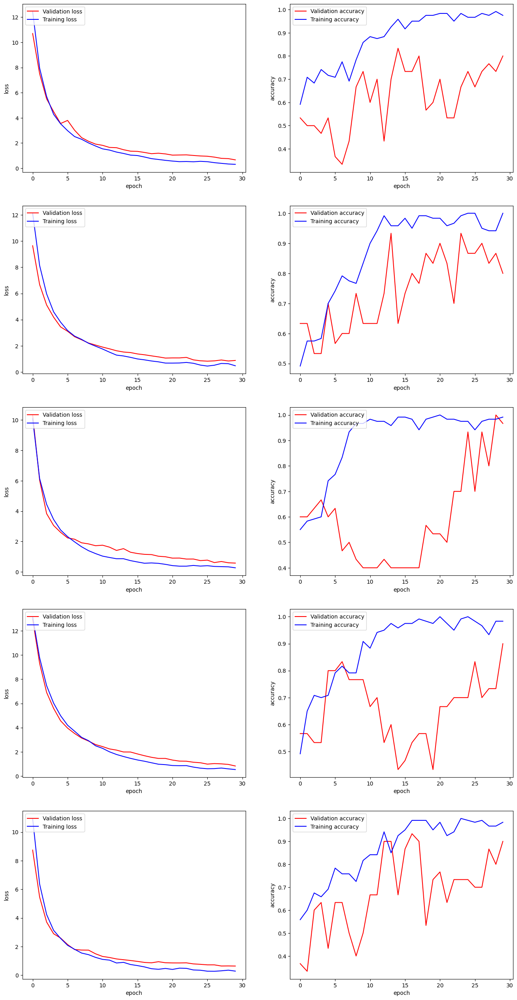

Accuracy: mean=87.333 std=6.464, n=5
bonjourcoucou


In [ ]:
my_classes = ['fox','Fox_negative_class']
run_evaluation_upgrade(5, 30, my_classes)

{'activation': 'relu', 'dropout_rate': 0.1, 'batch_size': 8, 'learning_rate': 0.001, 'optimizer': 'adamax'}

In [ ]:
  #definition du premier modèle baseline
def define_model_idg():


    model = Sequential()
    model.add(layers.Conv2D(64, (3, 3), activation='relu',
    input_shape=(IMG_SIZE, IMG_SIZE, 3)))
    model.add(MaxPooling2D(pool_size=(2, 2),
                           name="Maxpooling2D_1"))

    model.add(layers.Flatten())

    #model.add(layers.Dropout(0.1))
    model.add(layers.BatchNormalization())
    model.add(layers.Dense(100, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))




    model.compile(optimizer=Adamax(learning_rate=0.001), loss='binary_crossentropy',metrics=['accuracy'])

    return model

 #Evaluation avec un k-fold
def evaluate_model_idg(dataX, dataY, n_folds=5, epochs=30,batch_size=8):
    scores, histories = list(), list()
    kfold = KFold(n_folds, shuffle=True, random_state=1)
    #model = define_model()
     # parcourir les splits du k-fold
    for train_ix, test_ix in kfold.split(dataX):
        #define model
        model = define_model_idg()
        # selection des données
        X_train, y_train, X_test, y_test = dataX[train_ix], dataY[train_ix], dataX[test_ix], dataY[test_ix]

        # mis en place du générateur avec décalage de 0.2 en largeur, 0.2 en hauteur et
        # permutation horizontale
        datagen = ImageDataGenerator(width_shift_range=0.2,height_shift_range=0.2,horizontal_flip=True)

        # preparation de l'iterateur pour remplir les batchs.
        batches = datagen.flow(X_train, y_train, batch_size=batch_size)

        earlyStop = EarlyStopping(monitor='val_loss',mode='min',verbose=1, patience=10)
        # appel de la fonction fit. Dans les anciennes versions de Keras
        # mettre fit_generator
        history = model.fit(batches,steps_per_epoch=X_train.shape[0] // batch_size,epochs=epochs,validation_data=datagen.flow(X_test, y_test, batch_size=batch_size), verbose=1,callbacks=[earlyStop])
        # evaluate du modele
        loss, acc = model.evaluate(X_test, y_test, verbose=0)
        print('accuracy %.3f' % (acc * 100.0))
        scores.append(acc)
        histories.append(history)
    return scores, histories

def run_evaluation_idg(n_folds,epochs, my_classes):
    # load dataset
    X_train, y_train, X_test, y_test = load_dataset(my_classes)
    # Nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)

    scores, histories = evaluate_model_idg(X_train, y_train, n_folds,epochs)
    plot_curves_subplot(histories)
    print('Accuracy: mean=%.3f std=%.3f, n=%d' % (mean(scores)*100, std(scores)*100, len(scores)))



##Batch et drop out

Epoch 1/100
15/15 [==============================] - 2s 52ms/step - loss: 14.1509 - accuracy: 0.6000 - val_loss: 1.1252 - val_accuracy: 0.5667
Epoch 2/100
15/15 [==============================] - 1s 42ms/step - loss: 5.6345 - accuracy: 0.6417 - val_loss: 1.0993 - val_accuracy: 0.6333
Epoch 3/100
15/15 [==============================] - 1s 42ms/step - loss: 2.8210 - accuracy: 0.8083 - val_loss: 0.6922 - val_accuracy: 0.6000
Epoch 4/100
15/15 [==============================] - 1s 43ms/step - loss: 0.7229 - accuracy: 0.8417 - val_loss: 0.6341 - val_accuracy: 0.6000
Epoch 5/100
15/15 [==============================] - 1s 42ms/step - loss: 0.9724 - accuracy: 0.8667 - val_loss: 0.6365 - val_accuracy: 0.7000
Epoch 6/100
15/15 [==============================] - 1s 42ms/step - loss: 1.1279 - accuracy: 0.7917 - val_loss: 0.7050 - val_accuracy: 0.4333
Epoch 7/100
15/15 [==============================] - 1s 43ms/step - loss: 0.4344 - accuracy: 0.8667 - val_loss: 0.6951 - val_accuracy: 0.4333
Epoch

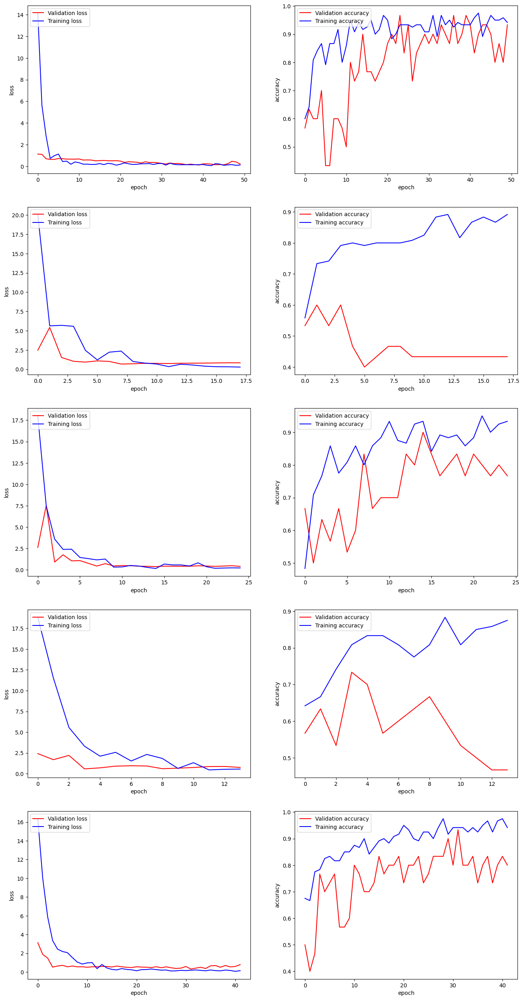

Accuracy: mean=67.333 std=19.020, n=5


In [ ]:
my_classes = ['fox','Fox_negative_class']
run_evaluation_idg(5, 100, my_classes)

##Drop out

Epoch 1/100
15/15 [==============================] - 16s 124ms/step - loss: 31.1355 - accuracy: 0.5833 - val_loss: 7.1303 - val_accuracy: 0.5667
Epoch 2/100
15/15 [==============================] - 1s 76ms/step - loss: 24.2946 - accuracy: 0.6833 - val_loss: 1.3929 - val_accuracy: 0.6333
Epoch 3/100
15/15 [==============================] - 1s 44ms/step - loss: 8.2612 - accuracy: 0.7250 - val_loss: 1.6343 - val_accuracy: 0.7333
Epoch 4/100
15/15 [==============================] - 1s 45ms/step - loss: 6.2031 - accuracy: 0.8000 - val_loss: 1.7434 - val_accuracy: 0.6333
Epoch 5/100
15/15 [==============================] - 1s 46ms/step - loss: 4.2862 - accuracy: 0.7750 - val_loss: 1.2691 - val_accuracy: 0.7333
Epoch 6/100
15/15 [==============================] - 1s 46ms/step - loss: 3.0108 - accuracy: 0.8250 - val_loss: 1.0801 - val_accuracy: 0.6333
Epoch 7/100
15/15 [==============================] - 1s 61ms/step - loss: 2.1271 - accuracy: 0.8167 - val_loss: 1.4335 - val_accuracy: 0.5333
Ep

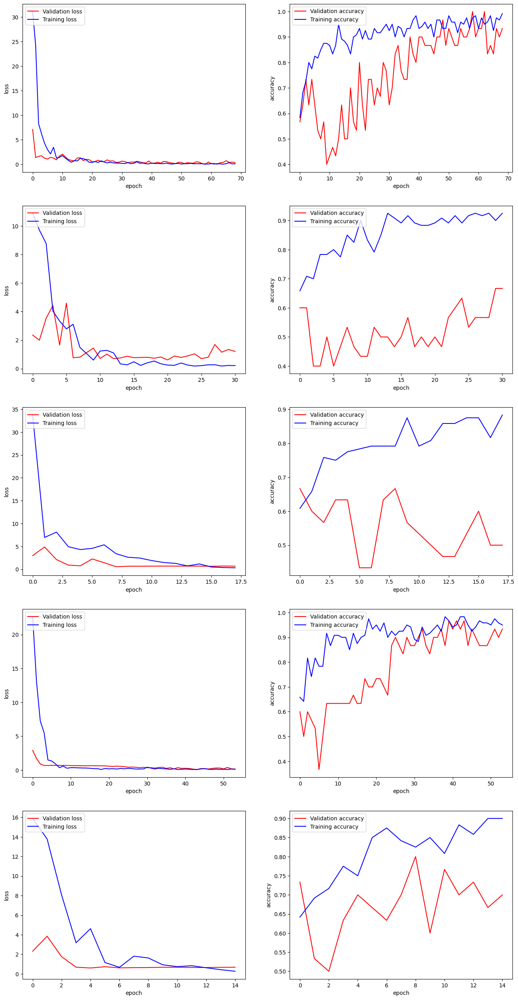

Accuracy: mean=71.333 std=19.619, n=5


In [ ]:
my_classes = ['fox','Fox_negative_class']
run_evaluation_idg(5, 100, my_classes)

#ImageDatagenerator

In [ ]:
from keras.regularizers import l2
  #definition du premier modèle baseline
def define_model_fox_upgrade():
    model = Sequential()
    # Convolution and pooling
    model.add(Conv2D(filters=64, kernel_size=(3,3),
                     activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3),
                     name="Conv2D_1"))

    model.add(MaxPooling2D(pool_size=(2, 2),
                           name="Maxpooling2D_1"))
    # flatten
    model.add(Flatten(name="flatten") )

    # Partie classification
    model.add(Dense(100, activation='relu'))
   # model.add(Dense(100, activation='relu',kernel_regularizer=l2(0.1)))
    model.add(Dropout(0.1))
    #model.add(layers.BatchNormalization())
    #keras.regularizers.L1(l1=0.1)

    model.add(Dense(1, activation='sigmoid'))




    return model

 #Evaluation avec un k-fold
def evaluate_model_fox_upgrade(model, dataX, dataY, n_folds=5, epochs=30):
    scores, histories = list(), list()
    kfold = KFold(n_folds, shuffle=True, random_state=1)
    # parcourir les splits du k-fold
    for train_ix, test_ix in kfold.split(dataX):
        #clone model
        model_kfold = tf.keras.models.clone_model(model)

        #compile model
        #adamax, 0,001
        model_kfold.compile(optimizer=Adamax(learning_rate=0.001), loss='binary_crossentropy',metrics=['accuracy'])
        print(model_kfold.summary())
        model_kfold.save('/content/drive/MyDrive/test_final/model')

        # selection des données
        X_train, y_train, X_test, y_test = dataX[train_ix], dataY[train_ix], dataX[test_ix], dataY[test_ix]

        #EarlyStopping pour éviter l'augmentation de la courbe validation loss
        earlyStop = EarlyStopping(monitor='val_loss',mode='min',verbose=1, patience=10)

        # fit du modele
        history = model_kfold.fit(X_train, y_train, epochs=epochs, batch_size=8,validation_data=(X_test, y_test), verbose=1, callbacks=[earlyStop])
        # evaluate du modele
        loss, acc = model_kfold.evaluate(X_test, y_test, verbose=0)
        print('accuracy %.3f' % (acc * 100.0))
        scores.append(acc)
        histories.append(history)
    return scores, histories

def run_evaluation_upgrade(n_folds,epochs, my_classes):
    # load dataset
    X_train, y_train, X_test, y_test = load_dataset(my_classes)
    # Nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)
    # define model
    model = define_model_fox_upgrade()
    print(model.summary())

    scores, histories = evaluate_model_fox_upgrade(model, X_train, y_train, n_folds,epochs)
    plot_curves_subplot(histories)
    print('Accuracy: mean=%.3f std=%.3f, n=%d' % (mean(scores)*100, std(scores)*100, len(scores)))
    print("bonjour")


Génération de nouvelle images

In [ ]:
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import os


def datagenerator( repertoire_init, repertoire_vers, nbImage ):

  datagen = ImageDataGenerator(
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

  for fichier in os.listdir(repertoire_init):
      if fichier.endswith('.jpg') or fichier.endswith('.png') or fichier.endswith('.jpeg'):
          chemin_image = os.path.join(repertoire_init, fichier)
          img = load_img(chemin_image)  # Charger l'image avec PIL
          x = img_to_array(img)  # Convertir en tableau Numpy
          x = x.reshape((1,) + x.shape)  # Ajuster la forme pour le générateur

          i = 0
          for batch in datagen.flow(x, batch_size=1,
                                  save_to_dir=repertoire_vers,
                                  save_prefix='fox', save_format='jpeg'):
            i += 1
            #nbImage est le nombre d'image que l'on va généré
            if i > nbImage:
                break

##Premier test avec 10 photo généré par images

In [ ]:
repertoire_vers = '/content/Data_Project/Tiger-Fox-Elephant/fox_negative_genere'
repertoire_init = '/content/Data_Project/Tiger-Fox-Elephant/Fox_negative_class'

datagenerator( repertoire_init, repertoire_vers, 3 )


In [ ]:
repertoire_vers = '/content/Data_Project/Tiger-Fox-Elephant/fox_genere'
repertoire_init = '/content/Data_Project/Tiger-Fox-Elephant/fox'

datagenerator( repertoire_init, repertoire_vers, 3 )


Modéle avec drop out

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 122, 122, 128)     3584      
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 61, 61, 128)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 476288)            0         
                                                                 
 dense_10 (Dense)            (None, 100)               47628900  
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 dense_11 (Dense)            (None, 1)                 101       
                                                      

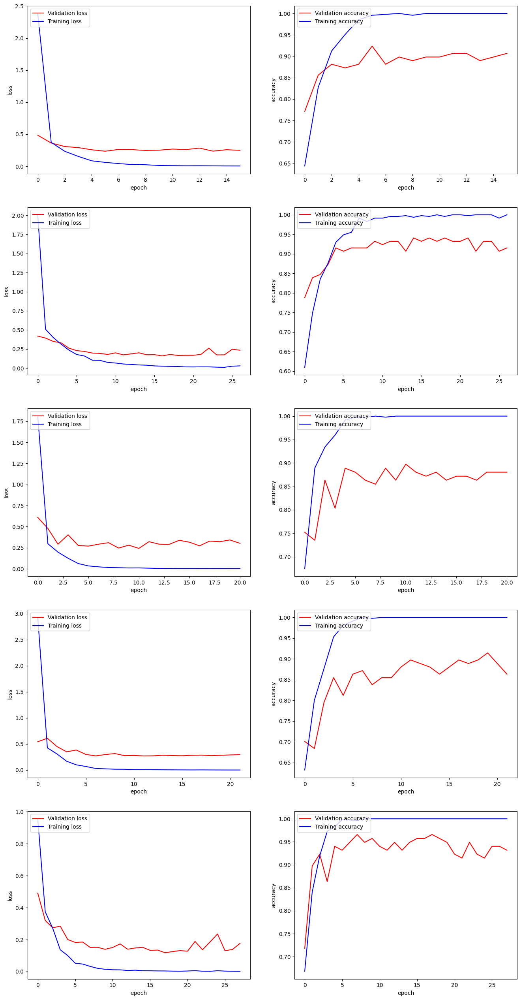

Accuracy: mean=89.945 std=2.455, n=5
coucou


In [ ]:
my_classes = ['fox_genere','fox_negative_genere']
run_evaluation_upgrade(5, 100, my_classes)

Batchnormalisation

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 122, 122, 128)     3584      
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 61, 61, 128)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 476288)            0         
                                                                 
 dense_12 (Dense)            (None, 100)               47628900  
                                                                 
 batch_normalization_5 (Bat  (None, 100)               400       
 chNormalization)                                                
                                                                 
 dense_13 (Dense)            (None, 1)                

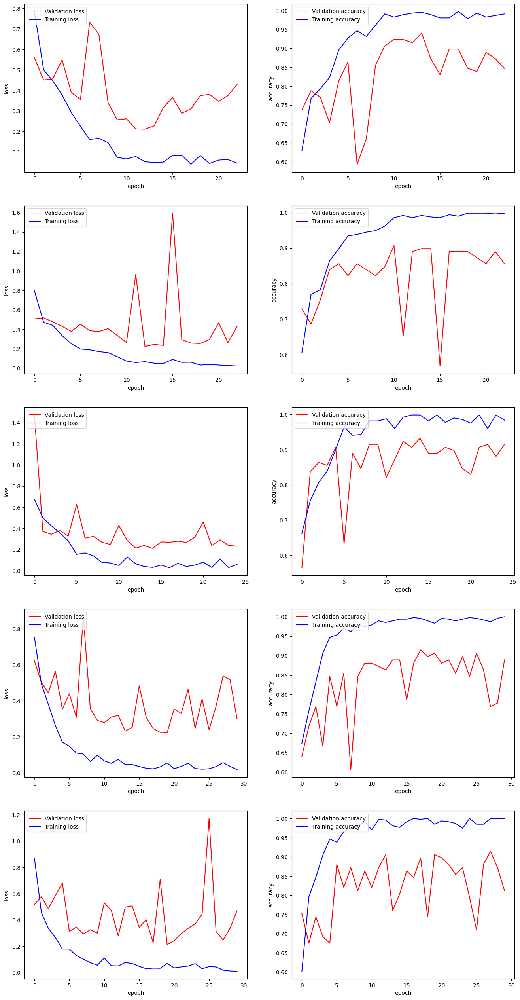

Accuracy: mean=86.375 std=3.527, n=5
coucou


In [ ]:
my_classes = ['fox_genere','fox_negative_genere']
run_evaluation_upgrade(5, 100, my_classes)

Drop out et Batchnormalisation

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 122, 122, 128)     3584      
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 61, 61, 128)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 476288)            0         
                                                                 
 dense_14 (Dense)            (None, 100)               47628900  
                                                                 
 dropout_1 (Dropout)         (None, 100)               0         
                                                                 
 batch_normalization_6 (Bat  (None, 100)               400       
 chNormalization)                                     

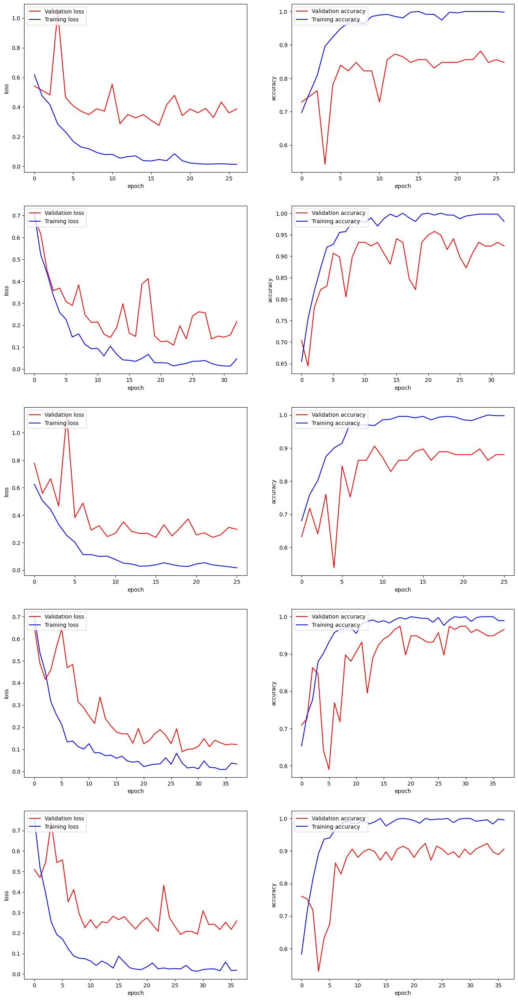

Accuracy: mean=90.466 std=3.992, n=5
coucou


In [ ]:
my_classes = ['fox_genere','fox_negative_genere']
run_evaluation_upgrade(5, 100, my_classes)

In [ ]:
my_path="Data_Project/Tiger-Fox-Elephant/"

X,y=create_X_y (my_path,my_classes)
print ("Nombre de données : ",X.shape[0])

Nombre de données :  783


## Augmentation des donnée
On génére 20 photos par image

In [ ]:
repertoire_vers = '/content/Data_Project/Tiger-Fox-Elephant/4k_fox_negative'
repertoire_init = '/content/Data_Project/Tiger-Fox-Elephant/Fox_negative_class'

datagenerator( repertoire_init, repertoire_vers, 20 )


In [ ]:
repertoire_vers = '/content/Data_Project/Tiger-Fox-Elephant/4k_fox'
repertoire_init = '/content/Data_Project/Tiger-Fox-Elephant/fox'

datagenerator( repertoire_init, repertoire_vers, 20 )

##Comparaison avec les filtres

Drop out
filtre = 128

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 122, 122, 64)      1792      
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 61, 61, 64)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 238144)            0         
                                                                 
 dense_8 (Dense)             (None, 100)               23814500  
                                                                 
 dropout_4 (Dropout)         (None, 100)               0         
                                                                 
 dense_9 (Dense)             (None, 1)                 101       
                                                      

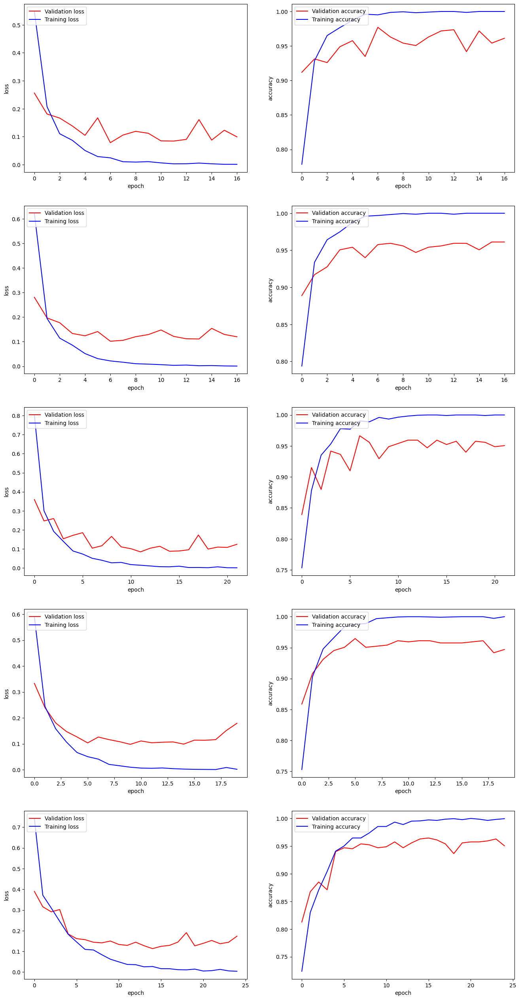

Accuracy: mean=95.409 std=0.595, n=5
bonjour


In [ ]:
my_classes = ['/content/Data_Project/Tiger-Fox-Elephant/4k_fox','/content/Data_Project/Tiger-Fox-Elephant/4k_fox_negative']
run_evaluation_upgrade(5, 100, my_classes)

Drop out filtre = 64 à 20 images\images

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 122, 122, 64)      1792      
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 61, 61, 64)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 238144)            0         
                                                                 
 dense_6 (Dense)             (None, 100)               23814500  
                                                                 
 dropout_3 (Dropout)         (None, 100)               0         
                                                                 
 dense_7 (Dense)             (None, 1)                 101       
                                                      

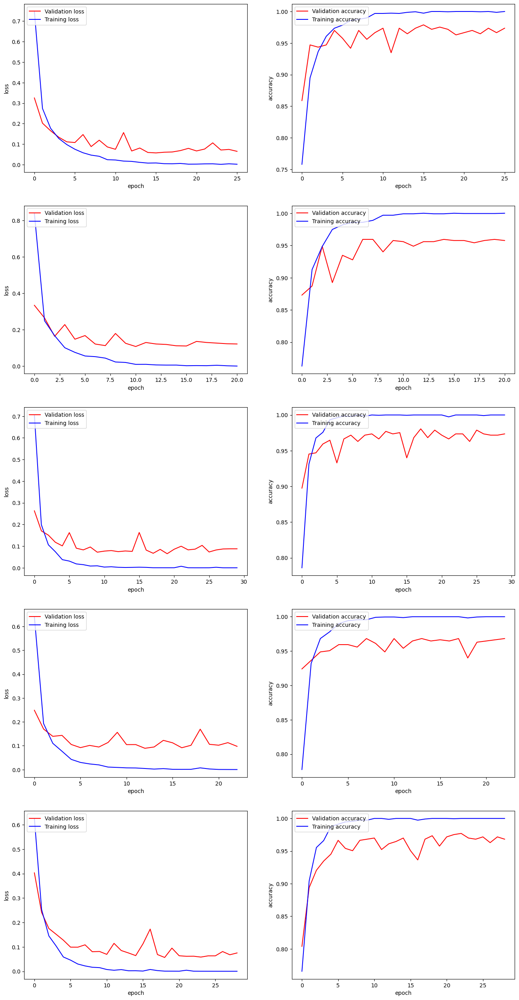

Accuracy: mean=96.822 std=0.579, n=5
bonjour


In [ ]:
my_classes = ['4k_fox','4k_fox_negative']
run_evaluation_upgrade(5, 100, my_classes)

Drop out filtre 64 à 10 images\images

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 122, 122, 128)     3584      
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 61, 61, 128)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 476288)            0         
                                                                 
 dense_2 (Dense)             (None, 100)               47628900  
                                                                 
 dropout_1 (Dropout)         (None, 100)               0         
                                                                 
 dense_3 (Dense)             (None, 1)                 101       
                                                      

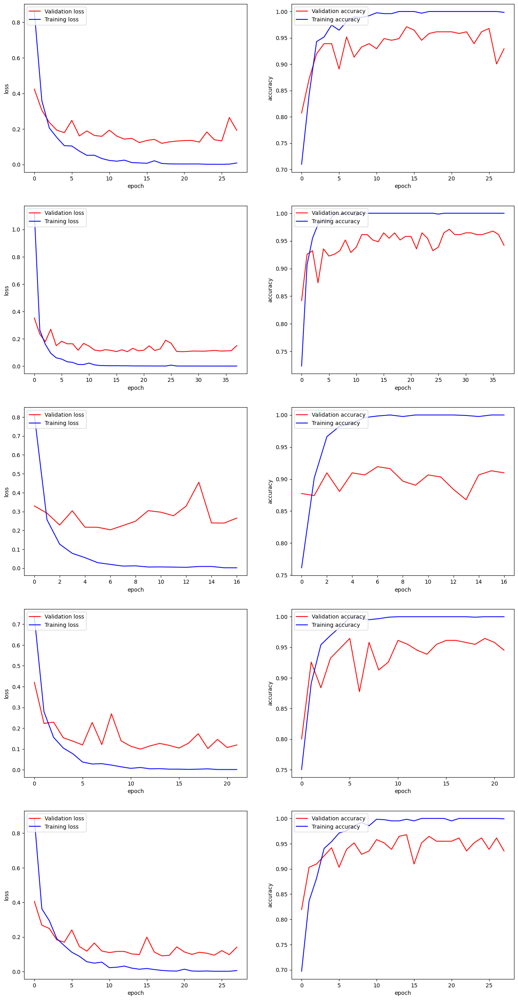

Accuracy: mean=93.230 std=1.257, n=5
bonjourcoucou


In [ ]:
my_classes = ['4k_fox','4k_fox_negative']
run_evaluation_upgrade(5, 100, my_classes)

In [ ]:
my_path="/content/Data_Project/Tiger-Fox-Elephant/"

X,y=create_X_y (my_path,my_classes)
print ("Nombre de données : ",X.shape[0])

Nombre de données :  2069


#Transfer learning

Nous allons tester les modeles suivant: VG16,VGG19,ResnetV2,Mobilnet

Modéle mobilenet_v2

In [ ]:

IMG_SIZE = 160
IMG_SHAPE = (IMG_SIZE,IMG_SIZE,3)

data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip('horizontal'),
  tf.keras.layers.RandomRotation(0.2, fill_mode='nearest'),
  tf.keras.layers.RandomZoom(0.2, fill_mode="nearest")
])
#Mobile net
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input
model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,include_top=False,weights='imagenet')

#ResnetV2
preprocess_input2 = tf.keras.applications.resnet_v2.preprocess_input
model_resnetV2 = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,include_top=False,weights='imagenet')

#VGG16
preprocess_input3 = tf.keras.applications.vgg16.preprocess_input
model_Vgg16 = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,include_top=False,weights='imagenet')

#VGG19
preprocess_input = tf.keras.applications.vgg19.preprocess_input
model_Vgg16 = tf.keras.applications.VGG19(input_shape=IMG_SHAPE,include_top=False,weights='imagenet')


9406464/9406464 [==============================] - 0s 0us/step


In [ ]:
my_path="Data_Project/Tiger-Fox-Elephant/"
my_classes=['fox','Fox_negative_class']
X,y=create_X_y (my_path,my_classes)

X_copy = copy.deepcopy(X)
y_copy = copy.deepcopy(y)

In [ ]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1024

# Evaluation avec un k-fold
def evaluate_model(dataX, dataY, base_model, n_folds=5, epochs=10, batch_size=32):
  scores, histories = list(), list()
  kfold = KFold(n_folds, shuffle=True, random_state=1)
  # parcourir les splits du k-fold
  for train_ix, test_ix in kfold.split(dataX):
    class_names = ['fox','Fox_negative_class']

    X_train, y_train, X_test, y_test = dataX[train_ix], dataY[train_ix], dataX[test_ix], dataY[test_ix]

    train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
    test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test))

    train_dataset = train_dataset.shuffle(SHUFFLE_BUFFER_SIZE).batch(batch_size)
    test_dataset = test_dataset.batch(batch_size)

    image_batch, label_batch = next(iter(train_dataset))
    feature_batch = base_model(image_batch)

    model = define_model(base_model, feature_batch)

    # fit du modele
    history = model.fit(train_dataset,epochs=epochs,validation_data=test_dataset)

    # evaluate du modele
    loss, acc = model.evaluate(X_test, y_test, verbose=0)
    y_pred = model.predict(X_test)
    print('accuracy %.3f' % (acc * 100.0))
    scores.append(acc)
    histories.append(history)
    plot_curves_subplot(histories)
  return scores, histories

# definition du premier modèle baseline
def define_model(base_model, feature_batch):
  base_model.trainable = False

  global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
  feature_batch_average = global_average_layer(feature_batch)
  print(feature_batch_average.shape)

  prediction_layer = tf.keras.layers.Dense(1)
  prediction_batch = prediction_layer(feature_batch_average)
  print(prediction_batch.shape)

  inputs = tf.keras.Input(shape=IMG_SHAPE)
  x = data_augmentation(inputs)
  x = preprocess_input(x)
  x = base_model(x, training=False)
  x = global_average_layer(x)
  x = tf.keras.layers.Dropout(0.2)(x)
  outputs = prediction_layer(x)
  model = tf.keras.Model(inputs, outputs)

  base_learning_rate = 0.001
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),metrics=['accuracy'])

  return model


# elle lance n-folds fois l'évaluation et affiche les courbes et résultats
def run_evaluation(X_learn, y_learn, n_folds, epochs, batch_size, base_model):
	# evaluate model
	scores, histories = evaluate_model(X_learn, y_learn, base_model, n_folds, epochs, batch_size)
	plot_curves(histories)
	print('Accuracy: mean=%.3f std=%.3f, n=%d' % (mean(scores)*100, std(scores)*100, len(scores)))


##Mobile net

In [ ]:
n_folds=5
epochs=100
batch_size=BATCH_SIZE
run_evaluation(X_copy, y_copy, n_folds, epochs, batch_size, model)

Output hidden; open in https://colab.research.google.com to view.

## ResnetV2

(32, 1280)
(32, 1)
Epoch 1/100
5/5 [==============================] - 4s 257ms/step - loss: 0.8494 - accuracy: 0.4563 - val_loss: 0.7300 - val_accuracy: 0.5500
Epoch 2/100
5/5 [==============================] - 0s 50ms/step - loss: 0.7112 - accuracy: 0.5750 - val_loss: 0.7070 - val_accuracy: 0.5750
Epoch 3/100
5/5 [==============================] - 0s 45ms/step - loss: 0.7528 - accuracy: 0.5312 - val_loss: 0.6890 - val_accuracy: 0.5750
Epoch 4/100
5/5 [==============================] - 0s 40ms/step - loss: 0.6833 - accuracy: 0.6187 - val_loss: 0.6615 - val_accuracy: 0.6250
Epoch 5/100
5/5 [==============================] - 0s 41ms/step - loss: 0.6609 - accuracy: 0.6313 - val_loss: 0.6447 - val_accuracy: 0.6500
Epoch 6/100
5/5 [==============================] - 0s 40ms/step - loss: 0.5402 - accuracy: 0.6875 - val_loss: 0.6428 - val_accuracy: 0.6750
Epoch 7/100
5/5 [==============================] - 0s 40ms/step - loss: 0.5388 - accuracy: 0.7125 - val_loss: 0.6284 - val_accuracy: 0.6750


2/2 [==============================] - 1s 18ms/step
accuracy 80.000


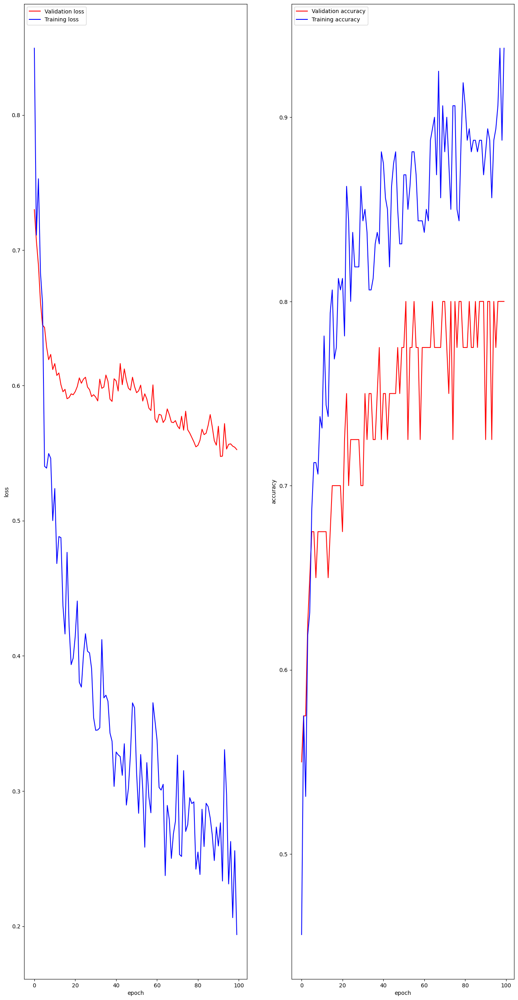

(32, 1280)
(32, 1)
Epoch 1/100
5/5 [==============================] - 5s 530ms/step - loss: 0.7809 - accuracy: 0.5688 - val_loss: 0.8397 - val_accuracy: 0.4750
Epoch 2/100
5/5 [==============================] - 0s 50ms/step - loss: 0.7551 - accuracy: 0.5562 - val_loss: 0.7677 - val_accuracy: 0.5000
Epoch 3/100
5/5 [==============================] - 0s 46ms/step - loss: 0.6693 - accuracy: 0.6687 - val_loss: 0.6226 - val_accuracy: 0.5750
Epoch 4/100
5/5 [==============================] - 0s 46ms/step - loss: 0.6514 - accuracy: 0.6562 - val_loss: 0.6584 - val_accuracy: 0.5750
Epoch 5/100
5/5 [==============================] - 0s 46ms/step - loss: 0.6151 - accuracy: 0.6625 - val_loss: 0.6836 - val_accuracy: 0.5500
Epoch 6/100
5/5 [==============================] - 0s 48ms/step - loss: 0.5941 - accuracy: 0.6687 - val_loss: 0.6437 - val_accuracy: 0.5750
Epoch 7/100
5/5 [==============================] - 0s 56ms/step - loss: 0.6391 - accuracy: 0.6500 - val_loss: 0.5796 - val_accuracy: 0.6500


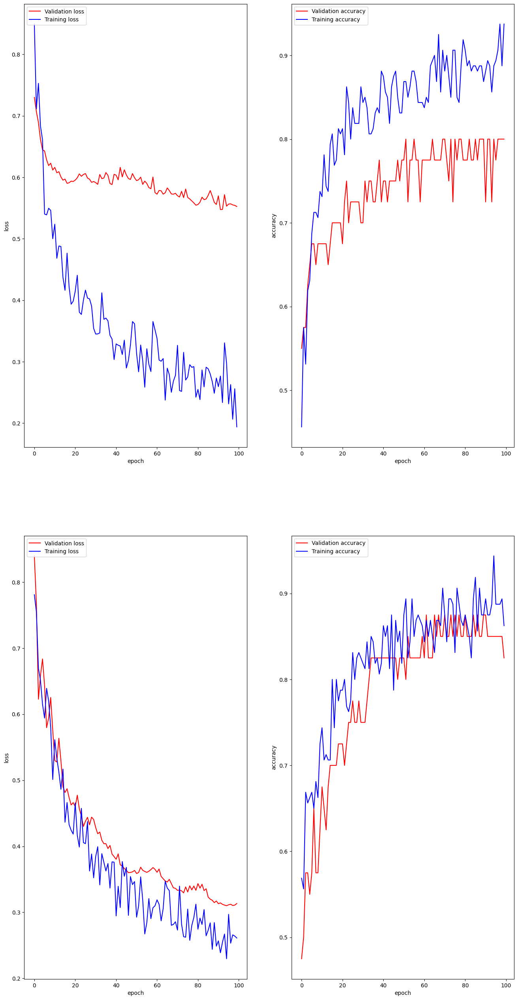

(32, 1280)
(32, 1)
Epoch 1/100
5/5 [==============================] - 5s 271ms/step - loss: 0.9035 - accuracy: 0.4750 - val_loss: 0.6155 - val_accuracy: 0.6750
Epoch 2/100
5/5 [==============================] - 0s 51ms/step - loss: 0.7677 - accuracy: 0.5437 - val_loss: 0.5560 - val_accuracy: 0.7250
Epoch 3/100
5/5 [==============================] - 0s 44ms/step - loss: 0.8027 - accuracy: 0.5625 - val_loss: 0.5677 - val_accuracy: 0.6750
Epoch 4/100
5/5 [==============================] - 0s 43ms/step - loss: 0.7735 - accuracy: 0.5437 - val_loss: 0.5190 - val_accuracy: 0.7250
Epoch 5/100
5/5 [==============================] - 0s 43ms/step - loss: 0.6474 - accuracy: 0.6313 - val_loss: 0.5036 - val_accuracy: 0.7250
Epoch 6/100
5/5 [==============================] - 0s 43ms/step - loss: 0.6242 - accuracy: 0.6438 - val_loss: 0.4833 - val_accuracy: 0.8000
Epoch 7/100
5/5 [==============================] - 0s 44ms/step - loss: 0.6778 - accuracy: 0.6187 - val_loss: 0.4758 - val_accuracy: 0.7500


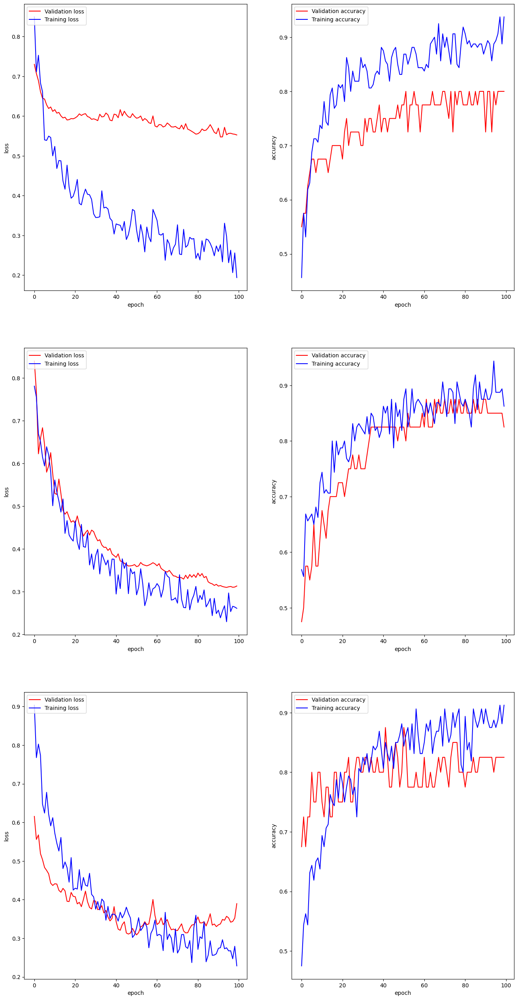

(32, 1280)
(32, 1)
Epoch 1/100
5/5 [==============================] - 4s 254ms/step - loss: 0.8717 - accuracy: 0.4625 - val_loss: 0.7232 - val_accuracy: 0.4750
Epoch 2/100
5/5 [==============================] - 0s 53ms/step - loss: 0.8191 - accuracy: 0.5063 - val_loss: 0.7044 - val_accuracy: 0.5000
Epoch 3/100
5/5 [==============================] - 0s 45ms/step - loss: 0.6955 - accuracy: 0.6062 - val_loss: 0.7499 - val_accuracy: 0.5500
Epoch 4/100
5/5 [==============================] - 0s 45ms/step - loss: 0.6731 - accuracy: 0.5500 - val_loss: 0.6965 - val_accuracy: 0.5750
Epoch 5/100
5/5 [==============================] - 0s 49ms/step - loss: 0.6252 - accuracy: 0.5750 - val_loss: 0.6834 - val_accuracy: 0.6250
Epoch 6/100
5/5 [==============================] - 0s 43ms/step - loss: 0.6032 - accuracy: 0.6250 - val_loss: 0.6851 - val_accuracy: 0.6000
Epoch 7/100
5/5 [==============================] - 0s 44ms/step - loss: 0.5982 - accuracy: 0.6687 - val_loss: 0.7006 - val_accuracy: 0.5750


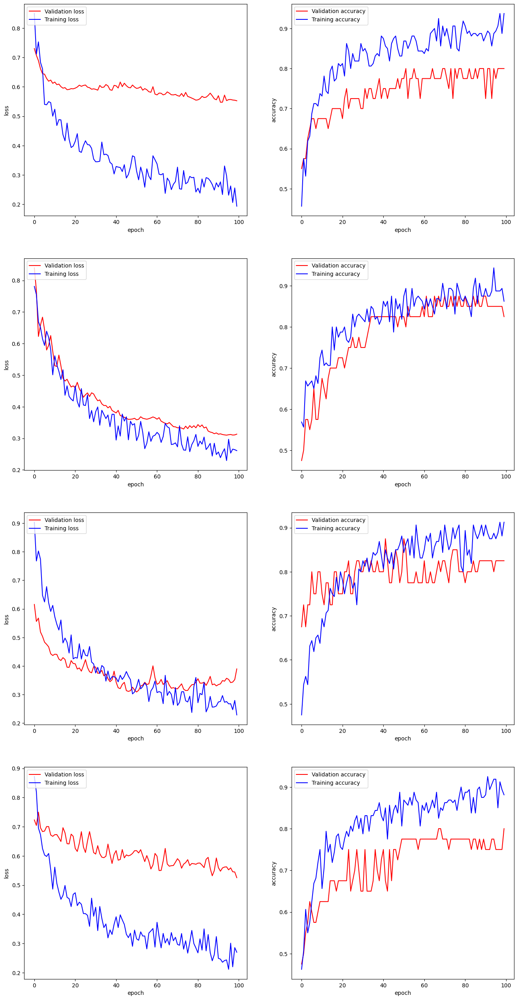

(32, 1280)
(32, 1)
Epoch 1/100
5/5 [==============================] - 4s 327ms/step - loss: 0.8383 - accuracy: 0.5063 - val_loss: 0.6845 - val_accuracy: 0.7000
Epoch 2/100
5/5 [==============================] - 0s 66ms/step - loss: 0.7211 - accuracy: 0.5437 - val_loss: 0.6173 - val_accuracy: 0.7750
Epoch 3/100
5/5 [==============================] - 0s 63ms/step - loss: 0.6564 - accuracy: 0.5938 - val_loss: 0.6084 - val_accuracy: 0.7750
Epoch 4/100
5/5 [==============================] - 0s 51ms/step - loss: 0.6464 - accuracy: 0.6812 - val_loss: 0.5880 - val_accuracy: 0.7750
Epoch 5/100
5/5 [==============================] - 0s 43ms/step - loss: 0.6396 - accuracy: 0.6375 - val_loss: 0.5908 - val_accuracy: 0.7750
Epoch 6/100
5/5 [==============================] - 0s 45ms/step - loss: 0.5802 - accuracy: 0.7000 - val_loss: 0.5575 - val_accuracy: 0.7750
Epoch 7/100
5/5 [==============================] - 0s 51ms/step - loss: 0.5601 - accuracy: 0.6562 - val_loss: 0.5100 - val_accuracy: 0.7750


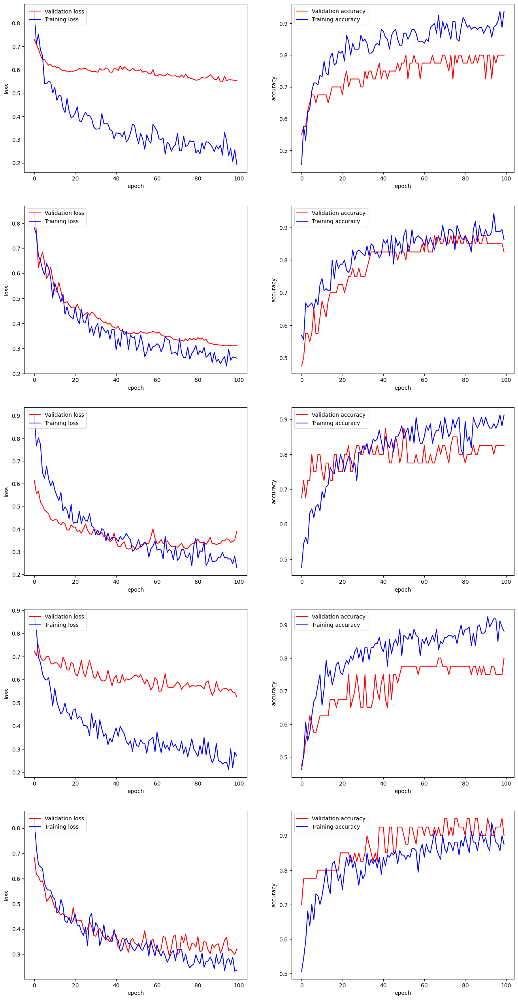

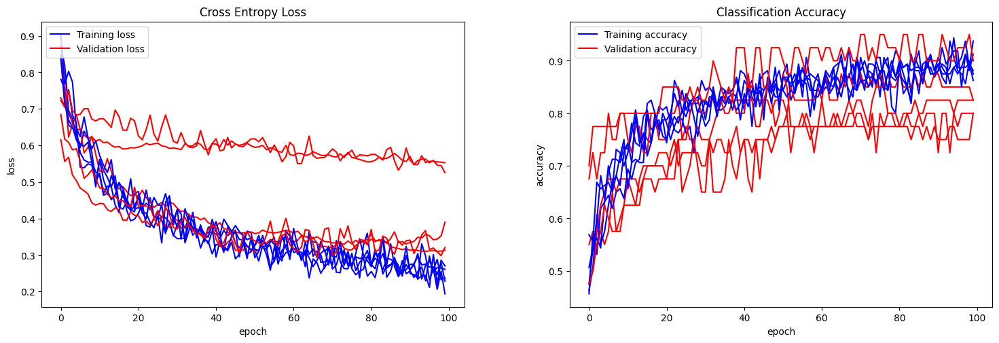

Accuracy: mean=83.000 std=3.674, n=5


In [ ]:
n_folds=5
epochs=100
batch_size=BATCH_SIZE
run_evaluation(X_copy, y_copy, n_folds, epochs, batch_size, model_resnetV2)

##VGG19

(32, 512)
(32, 1)
Epoch 1/100
5/5 [==============================] - 5s 333ms/step - loss: 2.7894 - accuracy: 0.4375 - val_loss: 1.2144 - val_accuracy: 0.6250
Epoch 2/100
5/5 [==============================] - 1s 109ms/step - loss: 2.3824 - accuracy: 0.4375 - val_loss: 1.2557 - val_accuracy: 0.6250
Epoch 3/100
5/5 [==============================] - 1s 111ms/step - loss: 1.8654 - accuracy: 0.5312 - val_loss: 1.2117 - val_accuracy: 0.6750
Epoch 4/100
5/5 [==============================] - 1s 110ms/step - loss: 1.9026 - accuracy: 0.5000 - val_loss: 0.9270 - val_accuracy: 0.6500
Epoch 5/100
5/5 [==============================] - 1s 111ms/step - loss: 1.7941 - accuracy: 0.5625 - val_loss: 0.6952 - val_accuracy: 0.7000
Epoch 6/100
5/5 [==============================] - 1s 110ms/step - loss: 1.1275 - accuracy: 0.6750 - val_loss: 0.5902 - val_accuracy: 0.8250
Epoch 7/100
5/5 [==============================] - 1s 111ms/step - loss: 1.3342 - accuracy: 0.5688 - val_loss: 0.5082 - val_accuracy: 0.

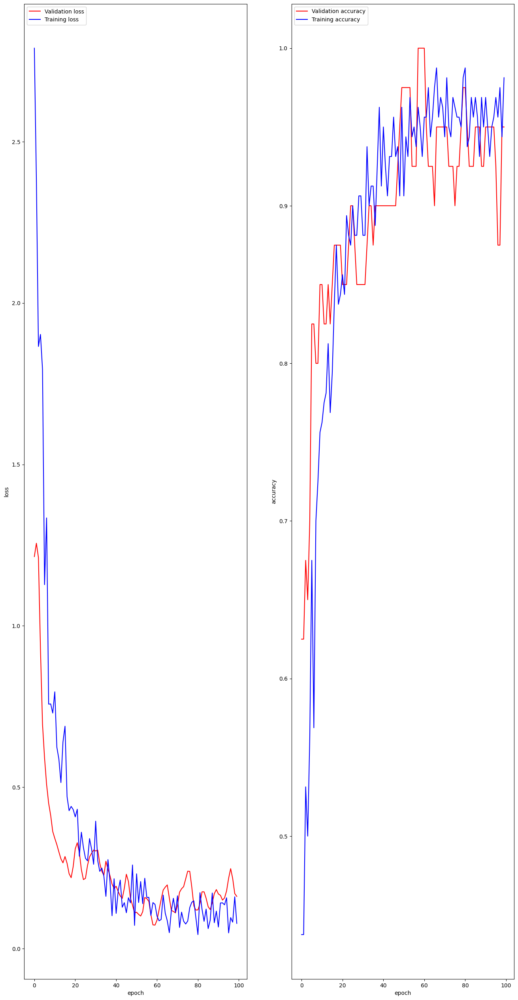

(32, 512)
(32, 1)
Epoch 1/100
5/5 [==============================] - 2s 165ms/step - loss: 1.8537 - accuracy: 0.5312 - val_loss: 1.2777 - val_accuracy: 0.7750
Epoch 2/100
5/5 [==============================] - 1s 118ms/step - loss: 1.7452 - accuracy: 0.5125 - val_loss: 1.0061 - val_accuracy: 0.7750
Epoch 3/100
5/5 [==============================] - 1s 120ms/step - loss: 1.3758 - accuracy: 0.6125 - val_loss: 0.7703 - val_accuracy: 0.8000
Epoch 4/100
5/5 [==============================] - 1s 122ms/step - loss: 1.1525 - accuracy: 0.6313 - val_loss: 0.6356 - val_accuracy: 0.8000
Epoch 5/100
5/5 [==============================] - 1s 123ms/step - loss: 1.0419 - accuracy: 0.6438 - val_loss: 0.5335 - val_accuracy: 0.8500
Epoch 6/100
5/5 [==============================] - 1s 122ms/step - loss: 0.9792 - accuracy: 0.6938 - val_loss: 0.4680 - val_accuracy: 0.8750
Epoch 7/100
5/5 [==============================] - 1s 124ms/step - loss: 0.9111 - accuracy: 0.7188 - val_loss: 0.3972 - val_accuracy: 0.

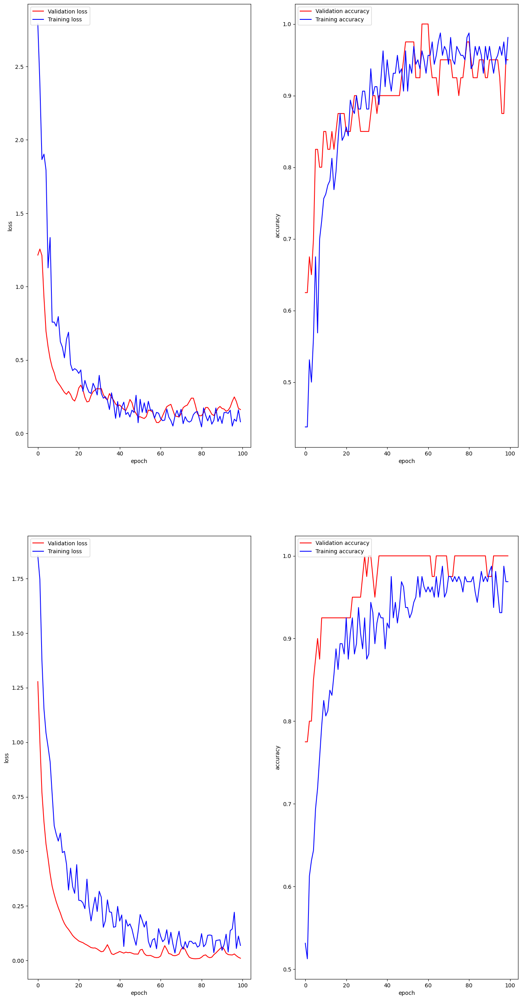

(32, 512)
(32, 1)
Epoch 1/100
5/5 [==============================] - 2s 172ms/step - loss: 2.2539 - accuracy: 0.4750 - val_loss: 1.5037 - val_accuracy: 0.5750
Epoch 2/100
5/5 [==============================] - 1s 118ms/step - loss: 1.5329 - accuracy: 0.5312 - val_loss: 1.7887 - val_accuracy: 0.5750
Epoch 3/100
5/5 [==============================] - 1s 118ms/step - loss: 1.7075 - accuracy: 0.5375 - val_loss: 1.7306 - val_accuracy: 0.6000
Epoch 4/100
5/5 [==============================] - 1s 117ms/step - loss: 1.5598 - accuracy: 0.5750 - val_loss: 1.5710 - val_accuracy: 0.6000
Epoch 5/100
5/5 [==============================] - 1s 117ms/step - loss: 1.0315 - accuracy: 0.6625 - val_loss: 1.1587 - val_accuracy: 0.6250
Epoch 6/100
5/5 [==============================] - 1s 115ms/step - loss: 0.9855 - accuracy: 0.6938 - val_loss: 0.9294 - val_accuracy: 0.7250
Epoch 7/100
5/5 [==============================] - 1s 114ms/step - loss: 0.8802 - accuracy: 0.7125 - val_loss: 0.9190 - val_accuracy: 0.

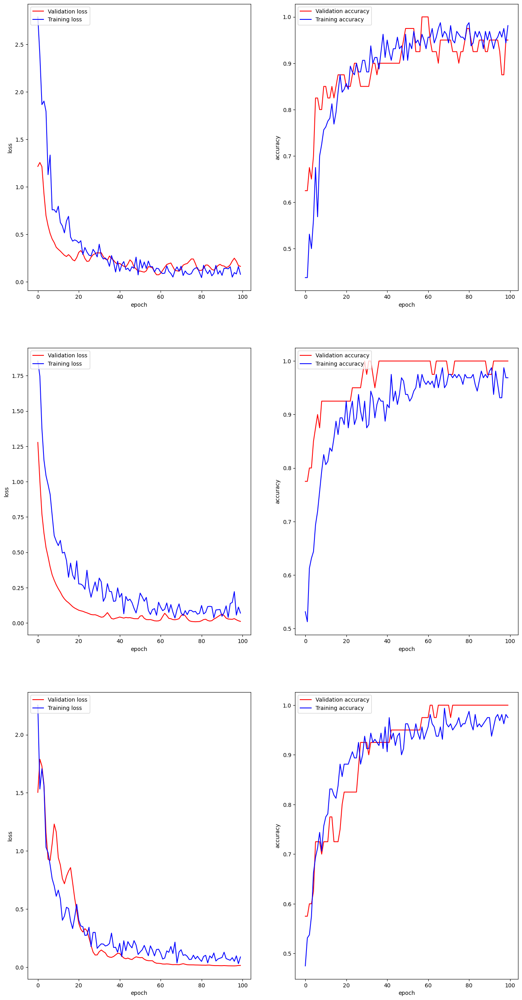

(32, 512)
(32, 1)
Epoch 1/100
5/5 [==============================] - 2s 173ms/step - loss: 2.8103 - accuracy: 0.4000 - val_loss: 3.0474 - val_accuracy: 0.2750
Epoch 2/100
5/5 [==============================] - 1s 118ms/step - loss: 2.4871 - accuracy: 0.4250 - val_loss: 2.7364 - val_accuracy: 0.3000
Epoch 3/100
5/5 [==============================] - 1s 130ms/step - loss: 2.3185 - accuracy: 0.4125 - val_loss: 2.4583 - val_accuracy: 0.3500
Epoch 4/100
5/5 [==============================] - 1s 121ms/step - loss: 1.7497 - accuracy: 0.4750 - val_loss: 2.1316 - val_accuracy: 0.4000
Epoch 5/100
5/5 [==============================] - 1s 130ms/step - loss: 1.3259 - accuracy: 0.5750 - val_loss: 1.8917 - val_accuracy: 0.4250
Epoch 6/100
5/5 [==============================] - 1s 130ms/step - loss: 1.1438 - accuracy: 0.6438 - val_loss: 1.7226 - val_accuracy: 0.5750
Epoch 7/100
5/5 [==============================] - 1s 128ms/step - loss: 1.0710 - accuracy: 0.6750 - val_loss: 1.5927 - val_accuracy: 0.

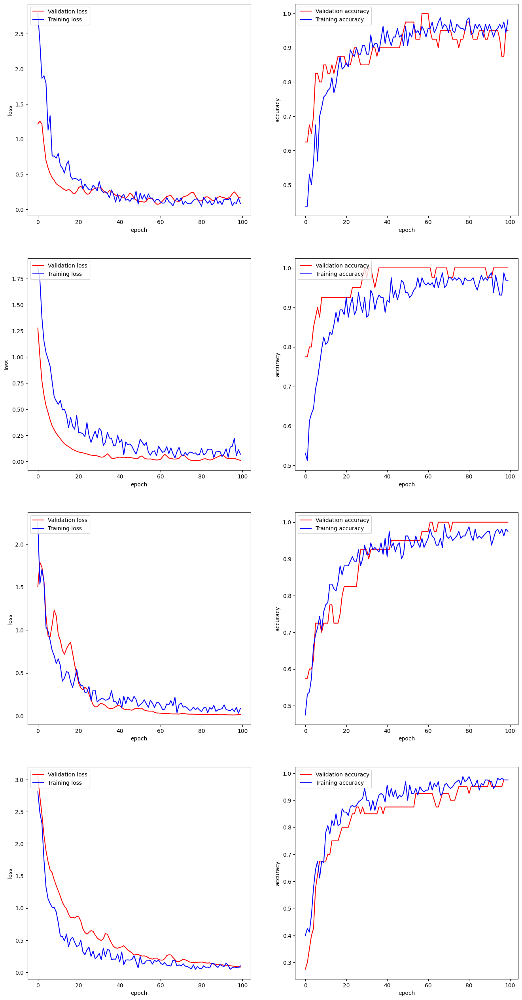

(32, 512)
(32, 1)
Epoch 1/100
5/5 [==============================] - 2s 169ms/step - loss: 2.7410 - accuracy: 0.4437 - val_loss: 1.5844 - val_accuracy: 0.5000
Epoch 2/100
5/5 [==============================] - 1s 118ms/step - loss: 1.7722 - accuracy: 0.5500 - val_loss: 1.4286 - val_accuracy: 0.5250
Epoch 3/100
5/5 [==============================] - 1s 121ms/step - loss: 1.4346 - accuracy: 0.6062 - val_loss: 1.1703 - val_accuracy: 0.5500
Epoch 4/100
5/5 [==============================] - 1s 118ms/step - loss: 1.4485 - accuracy: 0.6000 - val_loss: 0.9410 - val_accuracy: 0.7000
Epoch 5/100
5/5 [==============================] - 1s 118ms/step - loss: 1.3054 - accuracy: 0.6438 - val_loss: 0.7882 - val_accuracy: 0.7250
Epoch 6/100
5/5 [==============================] - 1s 117ms/step - loss: 1.1365 - accuracy: 0.6562 - val_loss: 0.6628 - val_accuracy: 0.7500
Epoch 7/100
5/5 [==============================] - 1s 118ms/step - loss: 1.1960 - accuracy: 0.6313 - val_loss: 0.5497 - val_accuracy: 0.

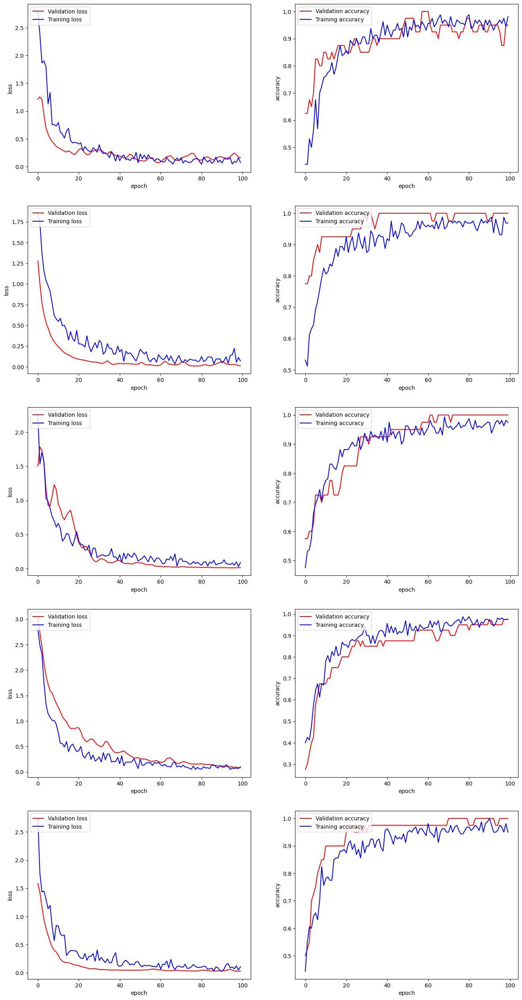

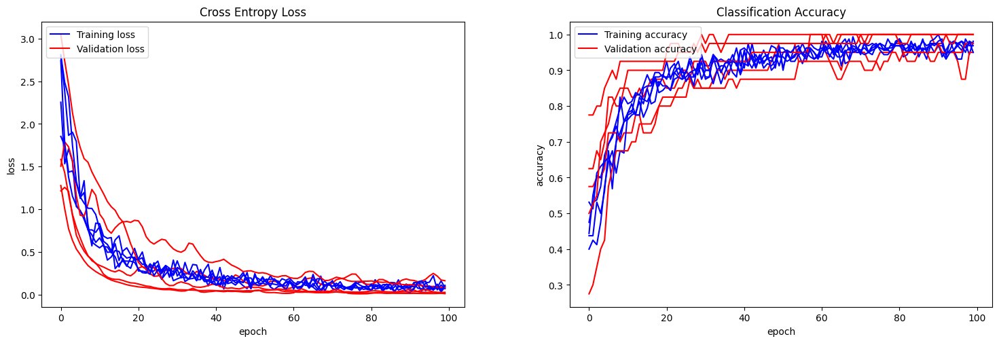

Accuracy: mean=98.500 std=2.000, n=5


In [ ]:
n_folds=5
epochs= 100
batch_size=BATCH_SIZE
run_evaluation(X_copy, y_copy, n_folds, epochs, batch_size, model_Vgg16)

##VGG16

(32, 512)
(32, 1)
Epoch 1/20
5/5 [==============================] - 2s 148ms/step - loss: 2.6377 - accuracy: 0.4062 - val_loss: 2.3955 - val_accuracy: 0.4000
Epoch 2/20
5/5 [==============================] - 0s 96ms/step - loss: 1.9454 - accuracy: 0.5375 - val_loss: 2.1254 - val_accuracy: 0.4250
Epoch 3/20
5/5 [==============================] - 0s 97ms/step - loss: 1.5218 - accuracy: 0.5750 - val_loss: 1.8531 - val_accuracy: 0.4750
Epoch 4/20
5/5 [==============================] - 0s 98ms/step - loss: 1.4613 - accuracy: 0.5750 - val_loss: 1.5938 - val_accuracy: 0.5250
Epoch 5/20
5/5 [==============================] - 0s 96ms/step - loss: 1.3222 - accuracy: 0.6500 - val_loss: 1.4017 - val_accuracy: 0.5750
Epoch 6/20
5/5 [==============================] - 0s 98ms/step - loss: 1.0535 - accuracy: 0.7125 - val_loss: 1.1991 - val_accuracy: 0.6000
Epoch 7/20
5/5 [==============================] - 0s 96ms/step - loss: 1.1923 - accuracy: 0.7000 - val_loss: 1.0251 - val_accuracy: 0.6250
Epoch 8/

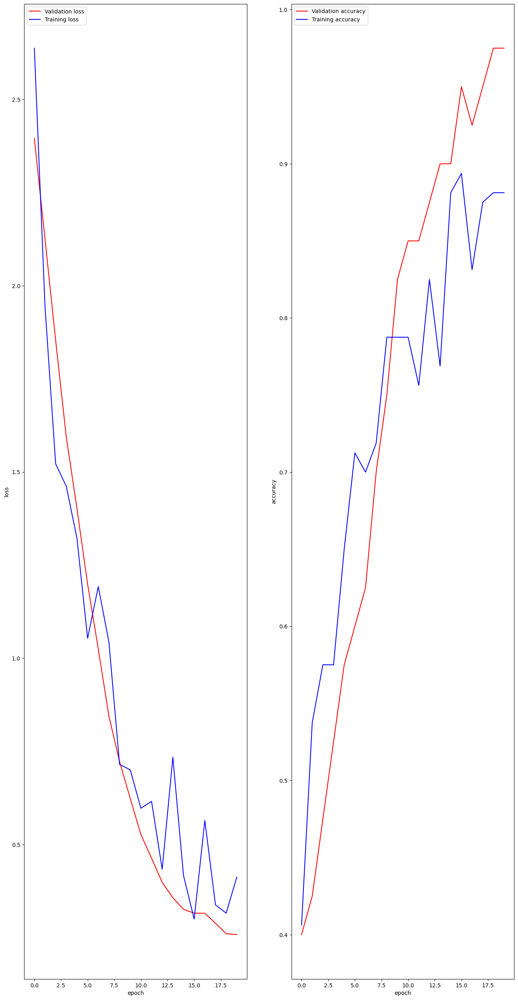

(32, 512)
(32, 1)
Epoch 1/20
5/5 [==============================] - 2s 161ms/step - loss: 2.3487 - accuracy: 0.4313 - val_loss: 2.6958 - val_accuracy: 0.4250
Epoch 2/20
5/5 [==============================] - 0s 101ms/step - loss: 1.8188 - accuracy: 0.5625 - val_loss: 2.4496 - val_accuracy: 0.5500
Epoch 3/20
5/5 [==============================] - 0s 101ms/step - loss: 1.8382 - accuracy: 0.5625 - val_loss: 2.2982 - val_accuracy: 0.5750
Epoch 4/20
5/5 [==============================] - 0s 102ms/step - loss: 1.7579 - accuracy: 0.5750 - val_loss: 2.0808 - val_accuracy: 0.5750
Epoch 5/20
5/5 [==============================] - 0s 101ms/step - loss: 1.3536 - accuracy: 0.6375 - val_loss: 1.6228 - val_accuracy: 0.6250
Epoch 6/20
5/5 [==============================] - 0s 101ms/step - loss: 1.1366 - accuracy: 0.6562 - val_loss: 1.3297 - val_accuracy: 0.6500
Epoch 7/20
5/5 [==============================] - 0s 101ms/step - loss: 1.2180 - accuracy: 0.6875 - val_loss: 1.2021 - val_accuracy: 0.6500
Ep

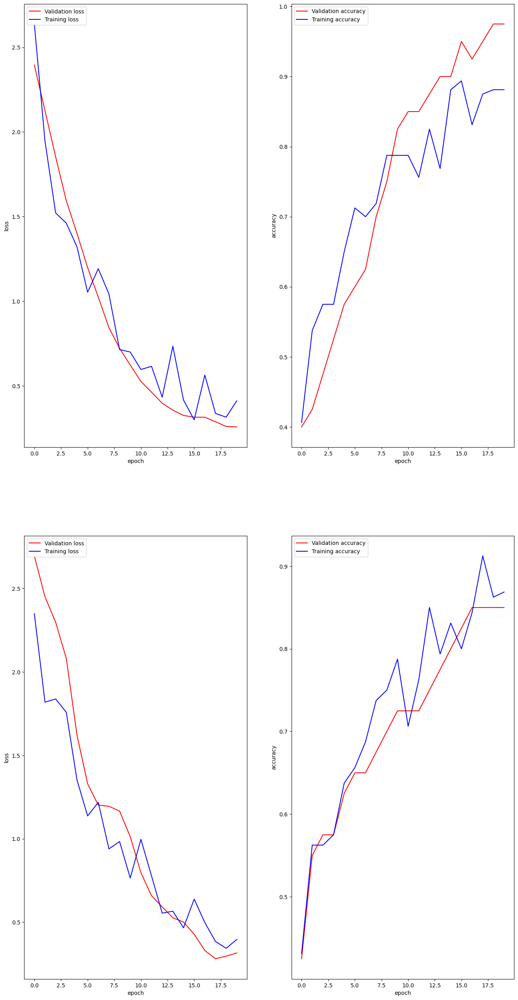

(32, 512)
(32, 1)
Epoch 1/20
5/5 [==============================] - 3s 178ms/step - loss: 1.8880 - accuracy: 0.5562 - val_loss: 1.2564 - val_accuracy: 0.6500
Epoch 2/20
5/5 [==============================] - 0s 98ms/step - loss: 1.4386 - accuracy: 0.6438 - val_loss: 1.1869 - val_accuracy: 0.5500
Epoch 3/20
5/5 [==============================] - 0s 100ms/step - loss: 1.4681 - accuracy: 0.5938 - val_loss: 1.0957 - val_accuracy: 0.5500
Epoch 4/20
5/5 [==============================] - 0s 100ms/step - loss: 1.2254 - accuracy: 0.6562 - val_loss: 0.8879 - val_accuracy: 0.5500
Epoch 5/20
5/5 [==============================] - 0s 100ms/step - loss: 1.1033 - accuracy: 0.6938 - val_loss: 0.7386 - val_accuracy: 0.6750
Epoch 6/20
5/5 [==============================] - 1s 112ms/step - loss: 1.2960 - accuracy: 0.6313 - val_loss: 0.6512 - val_accuracy: 0.7500
Epoch 7/20
5/5 [==============================] - 0s 101ms/step - loss: 0.7912 - accuracy: 0.7625 - val_loss: 0.5471 - val_accuracy: 0.7250
Epo

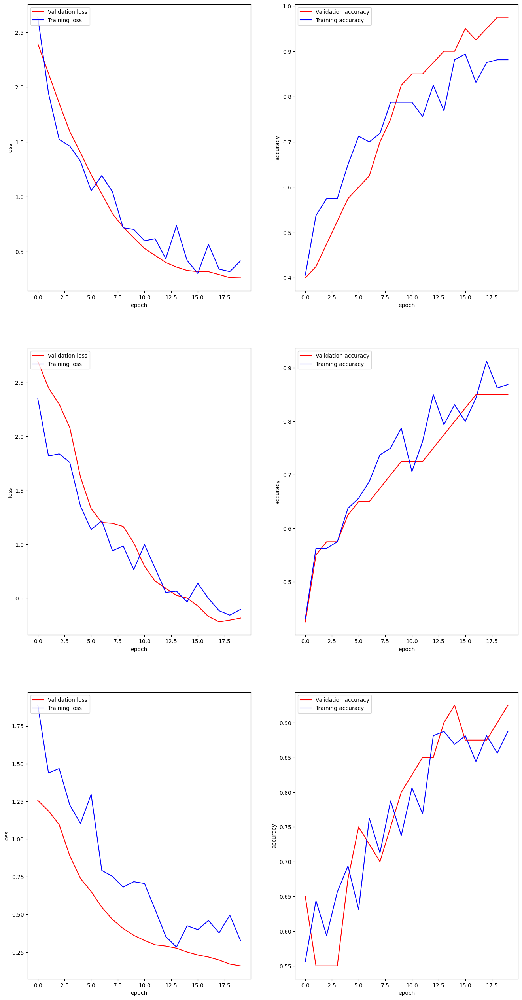

(32, 512)
(32, 1)
Epoch 1/20
5/5 [==============================] - 2s 146ms/step - loss: 1.8706 - accuracy: 0.5437 - val_loss: 1.8998 - val_accuracy: 0.5250
Epoch 2/20
5/5 [==============================] - 0s 100ms/step - loss: 1.7188 - accuracy: 0.5500 - val_loss: 1.7576 - val_accuracy: 0.5750
Epoch 3/20
5/5 [==============================] - 0s 99ms/step - loss: 1.2493 - accuracy: 0.6313 - val_loss: 1.5242 - val_accuracy: 0.6250
Epoch 4/20
5/5 [==============================] - 0s 98ms/step - loss: 1.2924 - accuracy: 0.6375 - val_loss: 1.3355 - val_accuracy: 0.6250
Epoch 5/20
5/5 [==============================] - 1s 110ms/step - loss: 1.0006 - accuracy: 0.6812 - val_loss: 1.1798 - val_accuracy: 0.6500
Epoch 6/20
5/5 [==============================] - 1s 114ms/step - loss: 0.9898 - accuracy: 0.6875 - val_loss: 1.0349 - val_accuracy: 0.7000
Epoch 7/20
5/5 [==============================] - 1s 115ms/step - loss: 0.7320 - accuracy: 0.7375 - val_loss: 0.9177 - val_accuracy: 0.7000
Epoc

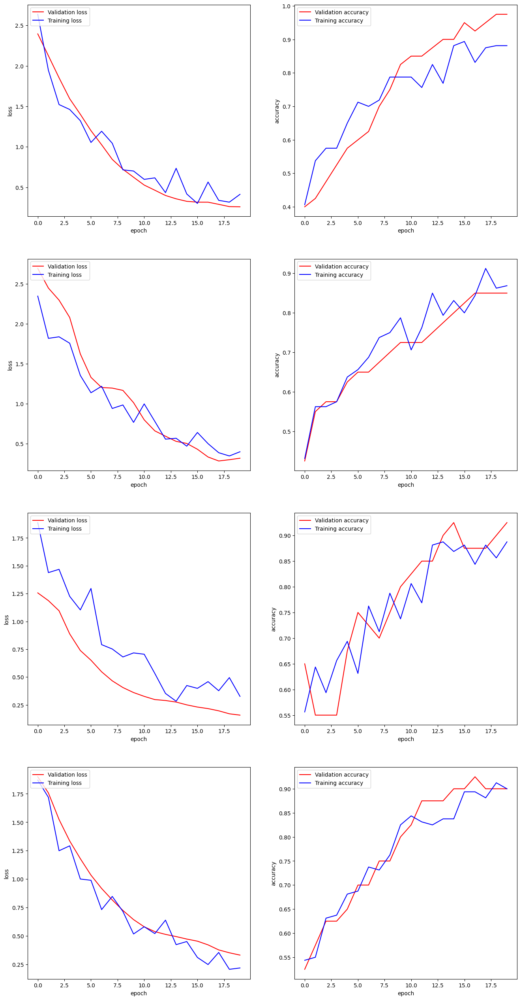

(32, 512)
(32, 1)
Epoch 1/20
5/5 [==============================] - 2s 150ms/step - loss: 1.9187 - accuracy: 0.5250 - val_loss: 2.0653 - val_accuracy: 0.5500
Epoch 2/20
5/5 [==============================] - 0s 99ms/step - loss: 1.6014 - accuracy: 0.5437 - val_loss: 1.7146 - val_accuracy: 0.5750
Epoch 3/20
5/5 [==============================] - 0s 97ms/step - loss: 1.4991 - accuracy: 0.5500 - val_loss: 1.5102 - val_accuracy: 0.6250
Epoch 4/20
5/5 [==============================] - 0s 100ms/step - loss: 1.0898 - accuracy: 0.7000 - val_loss: 1.3159 - val_accuracy: 0.6500
Epoch 5/20
5/5 [==============================] - 1s 113ms/step - loss: 1.0673 - accuracy: 0.6875 - val_loss: 1.1210 - val_accuracy: 0.7000
Epoch 6/20
5/5 [==============================] - 1s 113ms/step - loss: 0.9569 - accuracy: 0.7312 - val_loss: 0.9369 - val_accuracy: 0.7250
Epoch 7/20
5/5 [==============================] - 0s 102ms/step - loss: 0.8244 - accuracy: 0.7250 - val_loss: 0.7767 - val_accuracy: 0.7250
Epoc

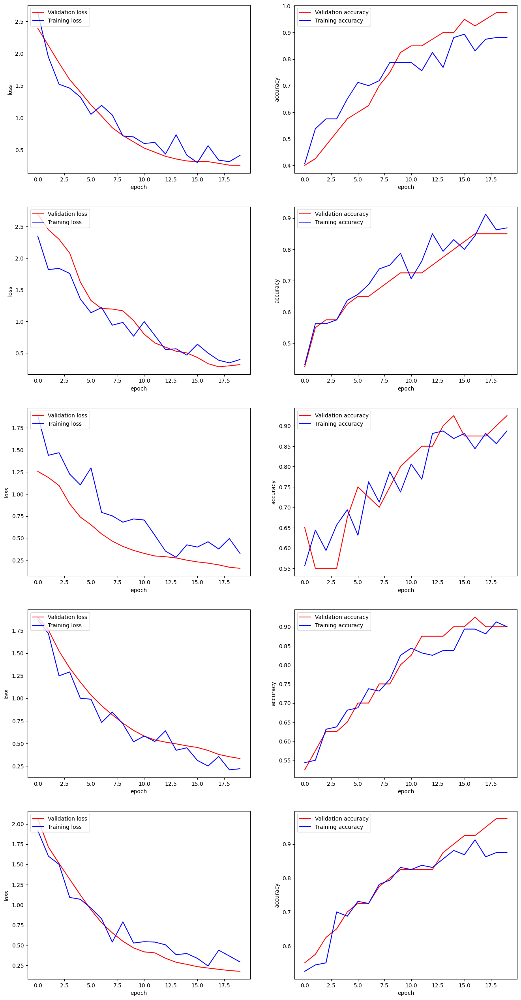

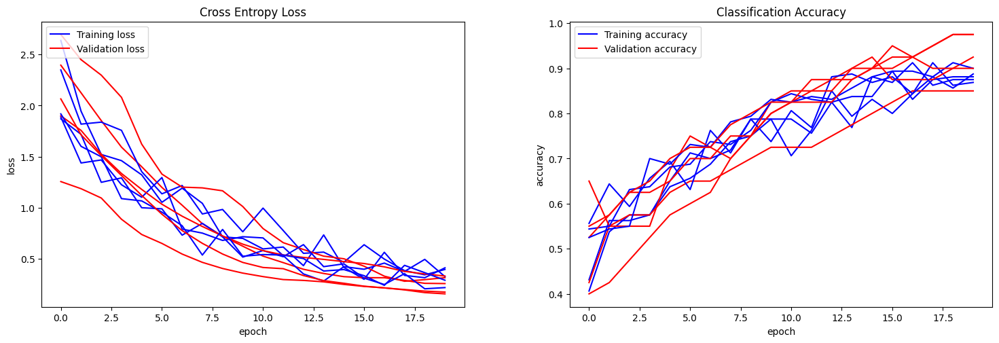

Accuracy: mean=92.500 std=4.743, n=5


In [ ]:
n_folds=5
epochs=20
batch_size=BATCH_SIZE
run_evaluation(X_copy, y_copy, n_folds, epochs, batch_size, model_Vgg16)

#Prediction sur les images gan



Découpage de  l'image

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
my_local_drive='/content/drive/MyDrive/GAN'
# Ajout du path pour les librairies, fonctions et données
sys.path.append(my_local_drive)
# Se positionner sur le répertoire associé
%cd $my_local_drive

%pwd

/content/drive/MyDrive/GAN


'/content/drive/MyDrive/GAN'

In [7]:
from PIL import Image

# Ouvrir l'image
img = Image.open('/content/drive/MyDrive/test_final/Copie de image_at_epoch_fox_5681.png')

# Obtenir les dimensions de l'image
largeur, hauteur = img.size

# Calculer la taille de chaque partie
taille_partie_x = largeur // 3
taille_partie_y = hauteur // 3

# Découper l'image en 9 parties égales
for i in range(3):
    for j in range(3):
        left = j * taille_partie_x
        upper = i * taille_partie_y
        right = left + taille_partie_x
        lower = upper + taille_partie_y
        morceau = img.crop((left, upper, right, lower))

        # Spécifier le chemin complet vers le répertoire où vous voulez sauvegarder l'image
        chemin_vers_repertoire = '/content/drive/MyDrive/test_final/image_decoupe/'

        # Nom de fichier pour l'image à sauvegarder
        nom_fichier = f'IMAGE_{i}_{j}.png'

        # Chemin complet pour enregistrer l'image
        chemin_complet = chemin_vers_repertoire + nom_fichier

        # Sauvegarder l'image dans le répertoire spécifié
        morceau.save(chemin_complet)


In [3]:
from PIL import Image

# Ouvrir l'image
img = Image.open('/content/drive/MyDrive/test_final/Copie de image_at_epoch_fox_5681.png')

# Obtenir les dimensions de l'image
largeur, hauteur = img.size

# Calculer la taille de chaque partie
taille_partie_x = largeur // 3
taille_partie_y = hauteur // 3

# Créer une liste pour stocker les morceaux
morceaux = []

# Découper l'image en 9 parties égales
for i in range(3):
    for j in range(3):
        left = j * taille_partie_x
        upper = i * taille_partie_y
        right = left + taille_partie_x
        lower = upper + taille_partie_y
        morceau = img.crop((left, upper, right, lower))
        morceaux.append(morceau)

# Enregistrer ou afficher les morceaux découpés
for i, morceau in enumerate(morceaux):
    # Enregistrer chaque morceau découpé
    nom_fichier = f'morceau_{i+1}.jpg'
    morceau.save('/content/drive/MyDrive/test_final/image_decoupe')

    # Afficher chaque morceau découpé
    morceau.show()


ValueError: ignored

Prediction

In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np
import os

# Chemin du répertoire contenant les images à prédire
directory_path = '/content/drive/MyDrive/test_final'

# Liste des fichiers images dans le répertoire
image_files = [file for file in os.listdir(directory_path) if file.lower().endswith(('.jpg', '.png'))]

# Faire des prédictions pour chaque image
predictions_list = []
for image_file in image_files:

    # Chemin complet de l'image
    img_path = os.path.join(directory_path, image_file)

    # Charger et prétraiter l'image
    img = image.load_img(img_path, target_size=(124, 124))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0  # Normaliser les valeurs de pixel

    # Faire la prédiction
    predictions = model.predict(img_array)
    predicted_class = np.argmax(predictions)

    # Stocker les résultats de prédiction pour chaque image
    predictions_list.append((img_path, predicted_class))

# Afficher les résultats
for img_path, predicted_class in predictions_list:
    print(f"Image : {img_path}, Classe prédite : {predicted_class}")


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
1/1 [==============================] - 0s 25ms/step
Image : /content/drive/MyDrive/test_final/image_at_epoch_5110_part_0_0.png, Classe prédite : 0
Image : /content/drive/MyDrive/test_final/image_at_epoch_5110_part_0_1.png, Classe prédite : 0
Image : /content/drive/MyDrive/test_final/image_at_epoch_5110_part_0_2.png, Classe prédite : 0
Image : /content/drive/MyDrive/test_final/image_at_epoch_5110_part_1_0.png, Classe prédite : 0
Image : /content/drive/MyDrive/test_final/image_at_epoch_5110_part_1_1.png, Classe prédite : 0
Image : /content/drive/MyDrive/test_final/image_at_epoch_5110_part_1_2.png, Classe prédite : 0
Image : /content/drive/MyDrive/test_final/image_at_epoch_5110_part_2_0.png, Classe prédite : 0
Image : /content/drive/MyDrive/test_final/image_at_epoch_5110_part_2_1.png, Classe prédite : 0
Image : /content/drive/MyDrive/test_final/image_at_epoch_5110_part_2_2.png, Classe prédite : 0
Image : /conten

In [19]:
from tensorflow.keras.preprocessing import image
import numpy as np
import os

# Chemin du répertoire contenant les images à prédire
directory_path = '/content/drive/MyDrive/test_final/image_decoupe'

# Liste des fichiers images dans le répertoire
image_files = [file for file in os.listdir(directory_path) if file.lower().endswith(('.jpg', '.png'))]
model = load_model('/content/drive/MyDrive/test_final/model')
# Faire des prédictions pour chaque image
predictions_list = []
for image_file in image_files:

    # Chemin complet de l'image
    img_path = os.path.join(directory_path, image_file)

    # Charger et prétraiter l'image
    img = image.load_img(img_path, target_size=(124, 124))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0  # Normaliser les valeurs de pixel

    # Faire la prédiction
    predictions = model.predict(img_array)
    predicted_class = np.argmax(predictions)

    # Stocker les résultats de prédiction pour chaque image
    predictions_list.append((img_path, predicted_class))

# Afficher les résultats
for img_path, predicted_class in predictions_list:
    print(f"Image : {img_path}, Classe prédite : {predicted_class}")


1/1 [==============================] - 0s 20ms/step
Image : /content/drive/MyDrive/test_final/image_decoupe/IMAGE_0_0.png, Classe prédite : 0
Image : /content/drive/MyDrive/test_final/image_decoupe/IMAGE_0_1.png, Classe prédite : 0
Image : /content/drive/MyDrive/test_final/image_decoupe/IMAGE_0_2.png, Classe prédite : 0
Image : /content/drive/MyDrive/test_final/image_decoupe/IMAGE_1_0.png, Classe prédite : 0
Image : /content/drive/MyDrive/test_final/image_decoupe/IMAGE_1_1.png, Classe prédite : 0
Image : /content/drive/MyDrive/test_final/image_decoupe/IMAGE_1_2.png, Classe prédite : 0
Image : /content/drive/MyDrive/test_final/image_decoupe/IMAGE_2_0.png, Classe prédite : 0
Image : /content/drive/MyDrive/test_final/image_decoupe/IMAGE_2_1.png, Classe prédite : 0
Image : /content/drive/MyDrive/test_final/image_decoupe/IMAGE_2_2.png, Classe prédite : 0


In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np

# Charger le modèle
model = load_model('/content/drive/MyDrive/test_final/model')

# Charger et prétraiter l'image que vous souhaitez prédire
img_path = 'chemin/vers/votre_image.jpg'
img = image.load_img(img_path, target_size=(28, 28), grayscale=True)  # Adapter la taille si nécessaire
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0  # Normaliser les valeurs de pixel

# Faire la prédiction
predictions = model.predict(img_array)

# Afficher les résultats (exemple : afficher la classe prédite avec la plus haute probabilité)
predicted_class = np.argmax(predictions)
print(f"Classe prédite : {predicted_class}")


from tensorflow.keras.preprocessing import image
import numpy as np

# Charger le modèle
model = load_model('chemin/vers/votre_modele')

# Charger et prétraiter l'image que vous souhaitez prédire
img_path = 'chemin/vers/votre_image.jpg'
img = image.load_img(img_path, target_size=(28, 28), grayscale=True)  # Adapter la taille si nécessaire
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0  # Normaliser les valeurs de pixel

# Faire la prédiction
predictions = model.predict(img_array)

# Afficher les résultats (exemple : afficher la classe prédite avec la plus haute probabilité)
predicted_class = np.argmax(predictions)
print(f"Classe prédite : {predicted_class}")


In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np

# Chemin de l'image à prédire
img_path = '/chemin/vers/votre/image.jpg'  # Remplacez par le chemin de votre image

# Charger et prétraiter l'image
img = image.load_img(img_path, target_size=(124, 124))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0  # Normaliser les valeurs de pixel

# Faire la prédiction avec votre modèle
predictions = model.predict(img_array)
predicted_class = np.argmax(predictions)

# Afficher le résultat de la prédiction
print(f"Image : {img_path}, Classe prédite : {predicted_class}")